# **Abnormal Tooth Detection with Dental Enumeration and Diagnosis Using Deep Learning on Panoramic X-rays**

# 1.Introduction
In dental treatment planning, accurate detection and diagnosis of abnormal teeth in dental radiographs are essential to improve treatment outcomes and reduce procedural errors. However, manual analysis of panoramic dental radiographs is not only cumbersome but also prone to errors. Existing manual analysis methods often rely on the doctor's experience, which is highly subjective and susceptible to fatigue, representing a significant limitation in practice.

The aim of this project is to develop an automated deep learning-based system that can automatically identify abnormal teeth, including caries, deep caries, apical lesions, and impacted teeth. By using the standards of the International Dental Federation (FDI) system, this project strives to improve the effectiveness and accuracy of dental anomaly detection, thereby offering some improvements in patient care and treatment outcomes in dental practice.

In terms of image recognition techniques, this project attempts to employ a variety of advanced target detection and multi-label classification architectures. For example, YOLO (v8) models, known for their excellence in target detection, are used. Additionally, we have employed custom-designed models combined with data augmentation techniques to handle variations in image quality and tooth appearance.

By using the hierarchically labeled DENTEX dataset, our models can detect and diagnose abnormal teeth in panoramic dental radiographs to a certain extent. However, due to limitations in the training dataset and the number of training iterations, the accuracy of the models is not very high. The performance of the models is evaluated using metrics such as average precision (AP), average recall (AR), and F1 scores at each hierarchical level, and compared with existing methods for dental anomaly detection. Our preliminary study indicates that although the proposed solution offers some improvements in detection accuracy, its potential for application in clinical workflows still needs further exploration and enhancement.

The contribution of this project lies in utilizing advanced deep learning algorithms to improve the accuracy and effectiveness of dental anomaly detection to a certain extent, reducing the subjectivity and errors of manual analysis. As a graduate course project, we hope that in the future, by expanding the dataset and improving training methods, we can provide dentists with more accurate diagnostic tools, enhance patient experience, and drive the development of dental image analysis technology.

# 2.Data Souce
The dataset used for this project comes from the official website of [DENTEX](https://huggingface.co/datasets/ibrahimhamamci/DENTEX). This dataset was released as part of the Dental Enumeration and Diagnosis on Panoramic X-rays Challenge (DENTEX). The main goal of this challenge is to develop algorithms to detect abnormal teeth. The DENTEX dataset consists of panoramic dental X-rays provided by three academic institutions and has a hierarchical structure that enables more efficient use of the FDI system. The dataset includes three types of data:

(a) 693 X-rays labeled only for quadrant detection  
(b) 634 X-rays labeled for tooth detection with quadrant and tooth enumeration classifications  
(c) 1005 X-rays fully labeled for abnormal tooth detection with quadrant, tooth enumeration, and diagnosis classifications

According to the project requirements, we used the (c) type, which includes 1005 X-rays fully labeled for abnormal tooth detection with quadrant, tooth enumeration, and diagnosis classifications. This dataset is further divided into training, validation, and test sets to facilitate model training, tuning, and evaluation. The specific distribution is as follows:

1. **Training Set**: Includes 750 X-rays used for model training. These data help the model learn how to recognize and classify different dental anomalies.
2. **Validation Set**: Includes 50 X-rays used for model validation. During training, the validation set is used to adjust model parameters to improve the model's generalization and performance.
3. **Test Set**: Includes 250 X-rays used for the final evaluation of the model. The test set assesses the model's actual performance and verifies its effectiveness on unseen data.

All these datasets are meticulously annotated, including information on quadrants, tooth enumeration, and diagnosis classifications, ensuring that the model can accurately detect and diagnose dental anomalies. By using these detailed annotated data, we aim to enhance the accuracy and practicality of the model, providing an effective auxiliary tool for clinical dental diagnosis.


In [ ]:
import os
import json
import glob
import torch
import torchvision
import pandas as pd
import numpy as np
from PIL import Image, ImageEnhance
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.pyplot import cm
from pathlib import Path
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from torchvision.transforms import functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.roi_heads import fastrcnn_loss
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
import torch.nn.functional as F_torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as T


In [ ]:
!pip install ultralytics

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


# 3.Exploration of Dataset


## Dataset properties  
Following typical machine learning procedures and project requeirment, We only use the fully annotated label (c) dataset—consisting of 1005 panoramic X-rays, is split into subsets for training, validation, and testing that contain 705, 50, and 250 images respectively.

## Challenging Aspects

1. **Image Quality**  
Panoramic X-rays may have issues such as noise, blur, and uneven exposure, which can affect the accuracy of the model's detection and diagnosis. For example:
   - **Noise**: Random noise in the images may obscure dental details, making it difficult for the model to accurately identify and classify them.
   - **Blur**: Patient movement during the X-ray can cause blur, reducing detection accuracy.
   - **Uneven Exposure**: Uneven exposure may result in some areas of the image being too bright or too dark, complicating image processing and feature extraction.

2. **Model Complexity**  
Selecting an appropriate deep learning model and tuning its hyperparameters is a very complex and time-consuming process. Specific challenges include:
   - **Model Selection**: Comparing various deep learning models (such as Faster R-CNN, YOLO, etc.) to determine the most suitable one.
   - **Hyperparameter Tuning**: Adjusting hyperparameters such as learning rate, batch size, etc., to optimize model performance. This process often requires iterative experimentation and validation.
   - **Architecture Design**: Designing and modifying the model architecture for specific tasks to improve detection and classification accuracy.

3. **Training Time and Resources**  
Training deep learning models requires significant computing resources and time, especially when training on large datasets. Specific issues include:
   - **Insufficient Computing Resources**: Training large models requires high-performance GPUs or TPUs, but not all members have access to such hardware.
   - **Long Training Times**: Training a high-quality model can take days or even weeks, posing high demands on computing resources and time management.
   - **Code Execution Issues**: Due to different computer configurations, some members may not be able to run the complete training code, leading to inefficiencies in team collaboration.

4. **Overfitting**  
Due to the limited dataset, the model may overfit the training data, performing well on the training set but poorly on the test set. To address this issue, we have taken the following measures:
   - **Data Augmentation**: Expanding the training dataset by rotating, flipping, cropping, etc., to increase data diversity and enhance the model's generalization capability.

5. **Limited Deep Learning Experience**  
All members are studying deep learning for the first time this semester.
   - **Lack of Knowledge**: Insufficient understanding of fundamental deep learning concepts and techniques, leading to difficulties in model selection and tuning.
   - **Lack of Skills**: Inexperience in writing and debugging complex deep learning code, increasing the difficulty and time cost of development.
   - **Steep Learning Curve**: Mastering a large amount of new knowledge and skills in a short time is a significant challenge for all members.

6. **Difficult Topic**  
Compared to image classification projects, detection and recognition projects have more complex models and preprocessing. Specific issues include:
   - **Data Processing Complexity**: Preprocessing raw X-rays, such as image segmentation, feature extraction, and data annotation, is much more complex than simple image classification.
   - **Scarcity of Resources**: There are very few relevant papers and source codes available for this project, making it difficult to find reference materials and solve problems.

## preprocess

In the preprocessing stage of this project, we mainly completed the loading of data, the processing of annotation information, and the preliminary cleaning and organization of data, laying the foundation for subsequent model training and evaluation. The following is a summary of the specific steps:

1. Data loading:
*   Training set: Load training data from the specified directory, including image
files and annotation files. We extract image file information and merge it with the annotation data to form a DataFrame containing complete annotation information.
*   Validation set: Similar to the processing process of the training set, load the validation data and integrate the image and annotation information together.  
*   Test set: Load the images and annotation files of the test set, extract and organize relevant information, and prepare for the final test of the model.
<br><br>

2. Annotation information processing:
*   Extract key information from the annotation file and convert it into a format that is easier to handle.
*   Extract and convert each annotation to ensure that all information can be systematically presented in the DataFrame.
<br><br>

3. Data cleaning and organization:


*   Merge the image file with its corresponding annotation data, sort and reset the index as needed to ensure data consistency and integrity.  
*   Calculate the number of annotations for each image and add this information to the dataset for subsequent analysis and model training.
<br><br>

Through these steps, we have successfully organized and constructed a structured dataset that contains detailed annotation information for each image. This not only provides high-quality input data for model training, but also provides a reliable basis for the evaluation and analysis of model performance.

**Define functions for loading annotation files, getting a list of image files, merging annotation data with image file data, and creating a category dictionary.**
1. Define the data directory
2. Function to load the annotation file
3. Function to get the list of image files and create a DataFrame
4. Function to add the image ID to the file DataFrame
5. Create a category dictionary containing IDs and names

In [ ]:
# Define data directories
train_data_dir = '/home/featurize/data/quadrant-enumeration-disease'
val_data_dir = '/home/featurize/data/validation_data'
test_data_dir = '/home/featurize/data/disease'
data_dir = '/home/featurize/data'

# Function to load annotation file
def load_annotations(annotation_file):
    with open(annotation_file, 'r') as f:
        annotations = json.load(f)
    return annotations

# Function to get image file list and create a DataFrame
def get_image_files(data_dir):
    image_dir = os.path.join(data_dir, 'xrays')
    file_list = glob.glob(os.path.join(image_dir, '*.png'))
    file_name_list = [os.path.basename(file) for file in file_list]
    im_number_list = [int(os.path.splitext(file)[0].rsplit('_', maxsplit=1)[-1]) for file in file_name_list]

    files = pd.DataFrame({
        'image_number': im_number_list,
        'file_name': file_name_list,
        'file_path': file_list
    }).sort_values(by='image_number', ascending=True).reset_index(drop=True)
    return files

# Function to merge annotations with file DataFrame
def merge_annotations_with_files(annotations, files):
    images = pd.DataFrame(annotations.get('images'))
    images = images.rename(columns={'height': 'imageHeight', 'width': 'imageWidth'})
    js_im_df = images.merge(files, on='file_name', how='inner').\
                sort_values(by='id', ascending=True).\
                reset_index(drop=True).\
                rename(columns={'id': 'image_id'})
    return js_im_df

# Function to create category dictionaries containing IDs and names
def create_category_dicts(annotations):
    categories = {}
    for key in annotations.keys():
        if key.startswith('categories'):
            filtered_categories = {category['id']: category['name'] for category in annotations[key]}
            categories[key] = filtered_categories
            print(f'{key}: {filtered_categories}')
    return categories



**Process the annotation data of the training set and the validation set and generate a DataFrame containing image and annotation information**
1. Load and process the training set data
2. Define the function for processing annotations
3. Process the training set annotation data
4. Process the validation set data:
5. Add the number of annotations for each image

In [ ]:
# Load and process training data
train_annotation_file = os.path.join(train_data_dir, 'train_quadrant_enumeration_disease.json')
train_annotations = load_annotations(train_annotation_file)
train_files = get_image_files(train_data_dir)
train_df = merge_annotations_with_files(train_annotations, train_files)
display(train_df.head())

categories = create_category_dicts(train_annotations)

# Function to process annotations
def process_annotations(annotations, image_df, categories):
    an_df_list = []
    for idx, an_dict in enumerate(annotations.get('annotations')):
        if (idx + 1) % 500 == 0:
            print(f'Annotation {idx + 1} / {len(annotations.get("annotations"))}')

        image_id = an_dict.get('image_id')
        id_df = image_df.loc[image_df['image_id'] == image_id]

        # Find the quadrant, tooth position, and disease category for the annotation
        quadrant_id = an_dict.get('category_id_1')
        quadrant = categories.get('categories_1').get(quadrant_id)

        position_id = an_dict.get('category_id_2')
        position = categories.get('categories_2').get(position_id)

        disease_id = an_dict.get('category_id_3')
        disease = categories.get('categories_3').get(disease_id)

        id_df = id_df.assign(quadrant=quadrant,
                             position=position,
                             label=disease,
                             cl=disease_id,
                             area=[an_dict.get('area')],
                             bbox=[an_dict.get('bbox')],
                             box_name=(f'{os.path.splitext(id_df["file_name"].values[0])[0]}_'
                                       f'{idx}_{quadrant}_{position}'),
                             imageWidth=[id_df['imageWidth'].values[0]],
                             imageHeight=[id_df['imageHeight'].values[0]])
        an_df_list.append(id_df)
    an_df = pd.concat(an_df_list, axis=0, ignore_index=True)
    return an_df

# Process training data annotations
train_an_df = process_annotations(train_annotations, train_df, categories)

# Process validation data
val_annotation_file = os.path.join(val_data_dir, 'DENTEX_validation_triple.json')
val_annotations = load_annotations(val_annotation_file)
val_files = get_image_files(val_data_dir)
val_df = merge_annotations_with_files(val_annotations, val_files)
val_an_df = process_annotations(val_annotations, val_df, categories)

# Add annotation counts for each image
n_annotations = train_an_df[['file_name', 'label']].\
                groupby('file_name').count().\
                reset_index(drop=False).\
                rename(columns={'label': 'annotations'})

train_an_df = train_an_df.merge(n_annotations, on='file_name', how='inner').\
                sort_values(by='image_id', ascending=True).\
                reset_index(drop=True)
display(train_an_df.head(5))



,imageHeight,imageWidth,image_id,file_name,image_number,file_path
0,1316,2744,1,train_673.png,673,/home/featurize/data/quadrant-enumeration-dise...
1,1504,2872,2,train_283.png,283,/home/featurize/data/quadrant-enumeration-dise...
2,1316,2909,3,train_435.png,435,/home/featurize/data/quadrant-enumeration-dise...
3,1504,2872,4,train_95.png,95,/home/featurize/data/quadrant-enumeration-dise...
4,1504,2872,5,train_475.png,475,/home/featurize/data/quadrant-enumeration-dise...


categories_1: {0: '1', 1: '2', 2: '3', 3: '4'}
categories_2: {0: '1', 1: '2', 2: '3', 3: '4', 4: '5', 5: '6', 6: '7', 7: '8'}
categories_3: {0: 'Impacted', 1: 'Caries', 2: 'Periapical Lesion', 3: 'Deep Caries'}
Annotation 500 / 3529
Annotation 1000 / 3529
Annotation 1500 / 3529
Annotation 2000 / 3529
Annotation 2500 / 3529
Annotation 3000 / 3529
Annotation 3500 / 3529


,imageHeight,imageWidth,image_id,file_name,image_number,file_path,quadrant,position,label,cl,area,bbox,box_name,annotations
0,1316,2744,1,train_673.png,673,/home/featurize/data/quadrant-enumeration-dise...,4,8,Impacted,0,39683,"[542.0, 698.0, 220.0, 271.0]",train_673_0_4_8,13
1,1316,2744,1,train_673.png,673,/home/featurize/data/quadrant-enumeration-dise...,4,1,Periapical Lesion,2,21469,"[1288.3116883116884, 723.3766233766233, 62.337...",train_673_12_4_1,13
2,1316,2744,1,train_673.png,673,/home/featurize/data/quadrant-enumeration-dise...,3,2,Periapical Lesion,2,22286,"[1405.1948051948052, 724.6753246753246, 75.324...",train_673_10_3_2,13
3,1316,2744,1,train_673.png,673,/home/featurize/data/quadrant-enumeration-dise...,3,7,Caries,1,42235,"[1806.0, 696.0, 237.0, 308.0]",train_673_9_3_7,13
4,1316,2744,1,train_673.png,673,/home/featurize/data/quadrant-enumeration-dise...,3,6,Caries,1,46556,"[1667.0, 723.0, 237.0, 356.0]",train_673_8_3_6,13


**Process and visualize medical X-ray images in a training set, including loading data, processing annotations, drawing bounding boxes and labels, and saving the results as image files**
1. Define data directory and output directory
2. Load and process data
3. Create category dictionary
4. Process annotation data
5. Visualize annotation data

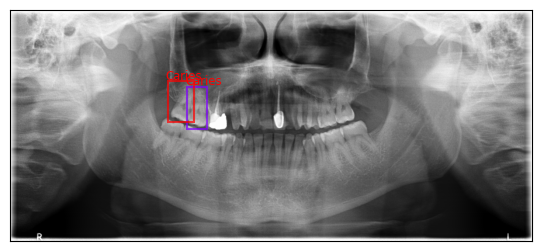

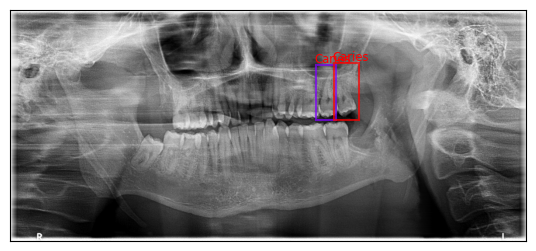

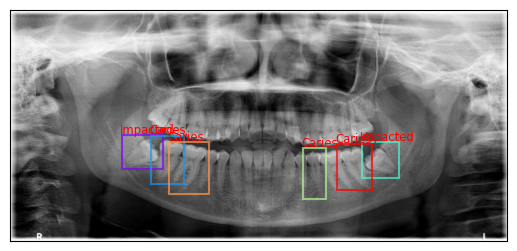

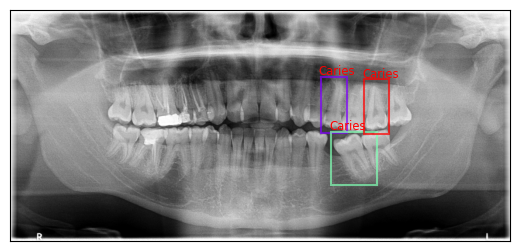

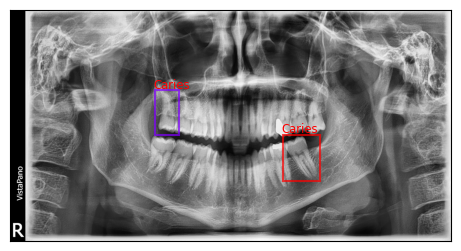

In [ ]:
output_dir = '/home/featurize/output_images'
# Randomly select 5 unique images and display the X-ray image with bounding box
os.makedirs(output_dir, exist_ok=True)
np.random.seed(5)
file_name_list = np.random.choice(train_an_df['file_name'].unique(), size=5, replace=False)

for file_name in file_name_list:
    an_file_df = train_an_df.loc[train_an_df['file_name'] == file_name]

    file = os.path.join(train_data_dir, 'xrays', file_name)
    im = Image.open(file).convert("RGB")

    # Create a list of colors for the rectangle
    color = cm.rainbow(np.linspace(0, 1, len(an_file_df)))
    color_list = [color[c] for c in range(len(color))]
    text_offset_xy = (-10, -10)

    # Create graphics and display panoramic X-ray images
    fig, ax = plt.subplots(figsize=(12, 3))
    ax.imshow(im)

    # Iterate over the bounding box
    for i, idx in enumerate(an_file_df.index):
        box_df = an_file_df.loc[an_file_df.index == idx]

        box = box_df['bbox'].values[0]
        bbox = box[0], box[1], box[0] + box[2], box[1] + box[3]
        label = box_df['label'].values[0]

        rect = patches.Rectangle(xy=(box[0], box[1]), width=box[2], height=box[3],
                                 linewidth=1.5, edgecolor=color_list[i],
                                 facecolor='none', alpha=0.7)
        ax.add_patch(rect)

        ax.text(box[0] + text_offset_xy[0],
                box[1] + text_offset_xy[1] + i,
                label,
                color='r',
                fontsize='small',
                fontweight='medium')

        ax.set(xticks=[], yticks=[])

    image_name = f'{os.path.splitext(file_name)[0]}_boxes.png'
    plt.savefig(os.path.join(output_dir, image_name), bbox_inches='tight')
    plt.show()

**Load and process the validation set data and generate a DataFrame containing annotation information**
1. Load validation set data
2. Process validation set data
3. Add the number of annotations for each image

In [ ]:
# Load validation data
val_annotation_file = os.path.join(val_data_dir, 'DENTEX_validation_triple.json')
val_annotations = load_annotations(val_annotation_file)
val_files = get_image_files(val_data_dir)
val_df = merge_annotations_with_files(val_annotations, val_files)
display(val_df.head())

# Process validation data annotations
val_an_df = process_annotations(val_annotations, val_df, categories)

# Add annotation counts for each image
n_annotations = val_an_df[['file_name', 'label']].\
                groupby('file_name').count().\
                reset_index(drop=False).\
                rename(columns={'label': 'annotations'})

val_an_df = val_an_df.merge(n_annotations, on='file_name', how='inner').\
                sort_values(by='image_id', ascending=True).\
                reset_index(drop=True)
display(val_an_df.head(5))

,imageHeight,imageWidth,image_id,file_name,image_number,file_path
0,1316,2892,1,val_15.png,15,/home/featurize/data/validation_data/xrays/val...
1,1316,2942,2,val_38.png,38,/home/featurize/data/validation_data/xrays/val...
2,1316,2987,3,val_33.png,33,/home/featurize/data/validation_data/xrays/val...
3,1504,2872,4,val_30.png,30,/home/featurize/data/validation_data/xrays/val...
4,1316,2970,5,val_5.png,5,/home/featurize/data/validation_data/xrays/val...


,imageHeight,imageWidth,image_id,file_name,image_number,file_path,quadrant,position,label,cl,area,bbox,box_name,annotations
0,1316,2892,1,val_15.png,15,/home/featurize/data/validation_data/xrays/val...,4,8,Impacted,0,37377,"[657.0, 606.0, 242.0, 204.0]",val_15_0_4_8,7
1,1316,2892,1,val_15.png,15,/home/featurize/data/validation_data/xrays/val...,3,8,Impacted,0,35904,"[2070.0, 655.0, 231.0, 195.0]",val_15_1_3_8,7
2,1316,2892,1,val_15.png,15,/home/featurize/data/validation_data/xrays/val...,1,8,Impacted,0,31554,"[815.0, 259.0, 209.0, 217.0]",val_15_2_1_8,7
3,1316,2892,1,val_15.png,15,/home/featurize/data/validation_data/xrays/val...,4,6,Caries,1,38380,"[987.0, 619.0, 200.0, 270.0]",val_15_3_4_6,7
4,1316,2892,1,val_15.png,15,/home/featurize/data/validation_data/xrays/val...,1,6,Caries,1,35046,"[1007.0, 315.0, 152.0, 291.0]",val_15_4_1_6,7


**Load and process the test set data and generate a DataFrame containing annotation information**
1. Get the list of test set annotation files, load and extract image information, and create a DataFrame containing annotation information
2. Generate a DataFrame containing annotation information
3. Calculate the number of annotations for each image and merge this information into the test set DataFrame

In [ ]:
# Define test data directories
test_image_dir = os.path.join(test_data_dir, 'input')
test_label_dir = os.path.join(test_data_dir, 'label')

# Get test image file list
test_file_list = glob.glob(os.path.join(test_image_dir, '*.png'))
test_file_name_list = [os.path.basename(file) for file in test_file_list]
test_im_number_list = [int(os.path.splitext(file)[0].rsplit('_', maxsplit=1)[-1]) for file in test_file_name_list]

test_files = pd.DataFrame({
    'image_number': test_im_number_list,
    'file_name': test_file_name_list,
    'file_path': test_file_list
}).sort_values(by='image_number', ascending=True).reset_index(drop=True)

# Get test annotation file list and load annotations
test_annotation_files = glob.glob(os.path.join(test_label_dir, '*.json'))
test_annotations_list = [load_annotations(file) for file in test_annotation_files]

# Extract image info from each json file and create DataFrame
def extract_image_info(annotation):
    image_info = {
        'file_name': annotation['imagePath'],
        'shapes': annotation['shapes'],
        'imageHeight': annotation['imageHeight'],
        'imageWidth': annotation['imageWidth']
    }
    return image_info

test_annotations_df_list = [pd.DataFrame([extract_image_info(annotation)]) for annotation in test_annotations_list]
test_annotations_df = pd.concat(test_annotations_df_list, ignore_index=True)

# Merge image ID with test file DataFrame
test_df = test_annotations_df.merge(test_files, on='file_name', how='inner').sort_values(by='file_name', ascending=True).reset_index(drop=True)
display(test_df.head())

# Extract annotations from shapes and convert to a more manageable format
def extract_shapes(shapes):
    annotations = []
    for shape in shapes:
        label = shape['label']
        points = shape['points']
        annotations.append({'label': label, 'points': points})
    return annotations

test_df['annotations'] = test_df['shapes'].apply(extract_shapes)
test_df = test_df.drop(columns=['shapes'])

# Process test annotations
def process_test_annotations(test_df, categories):
    an_df_list = []
    for idx, row in test_df.iterrows():
        for annotation_idx, annotation in enumerate(row['annotations']):
            label_parts = annotation['label'].split('-')
            disease_id = int(label_parts[0])
            position = label_parts[1]
            quadrant = label_parts[2] if len(label_parts) > 2 else None
            disease = categories.get('categories_3').get(disease_id)

            id_df = row.to_frame().T
            id_df = id_df.assign(quadrant=[quadrant],
                                 position=[position],
                                 label=[disease],
                                 cl=[disease_id],
                                 area=[None],
                                 bbox=[annotation['points']],
                                 box_name=[f'{os.path.splitext(row["file_name"])[0]}_{annotation_idx}_{quadrant}_{position}'])
            an_df_list.append(id_df)
    an_df = pd.concat(an_df_list, axis=0, ignore_index=True)
    return an_df

test_an_df = process_test_annotations(test_df, categories)

# Add annotation counts for each image
n_annotations = test_an_df[['file_name', 'label']].\
                groupby('file_name').count().\
                reset_index(drop=False).\
                rename(columns={'label': 'annotations'})

test_an_df = test_an_df.merge(n_annotations, on='file_name', how='inner').\
                sort_values(by='file_name', ascending=True).\
                reset_index(drop=True)
display(test_an_df.head(5))


,file_name,shapes,imageHeight,imageWidth,image_number,file_path
0,test_0.png,"[{'label': '3-kanal-36', 'points': [[1837.0, 8...",1316,2829,0,/home/featurize/data/disease/input/test_0.png
1,test_1.png,"[{'points': [[2164.0, 579.0], [2161.0, 679.0],...",1504,2872,1,/home/featurize/data/disease/input/test_1.png
2,test_10.png,"[{'label': '6-gömülü-38', 'points': [[2203.0, ...",1316,2940,10,/home/featurize/data/disease/input/test_10.png
3,test_100.png,"[{'line_color': None, 'fill_color': None, 'lab...",1316,2935,100,/home/featurize/data/disease/input/test_100.png
4,test_101.png,"[{'points': [[2273.0, 559.0], [2364.0, 614.0],...",1316,2915,101,/home/featurize/data/disease/input/test_101.png


,file_name,imageHeight,imageWidth,image_number,file_path,annotations_x,quadrant,position,label,cl,area,bbox,box_name,annotations_y
0,test_0.png,1316,2829,0,/home/featurize/data/disease/input/test_0.png,"[{'label': '3-kanal-36', 'points': [[1837.0, 8...",36,kanal,Deep Caries,3,None,"[[1837.0, 849.0], [1859.0, 886.0], [1878.0, 95...",test_0_0_36_kanal,4
1,test_0.png,1316,2829,0,/home/featurize/data/disease/input/test_0.png,"[{'label': '3-kanal-36', 'points': [[1837.0, 8...",38,gömülü,None,6,None,"[[2080.0, 833.0], [2118.0, 854.0], [2137.0, 92...",test_0_1_38_gömülü,4
2,test_0.png,1316,2829,0,/home/featurize/data/disease/input/test_0.png,"[{'label': '3-kanal-36', 'points': [[1837.0, 8...",26,çürük,Caries,1,None,"[[1870.0, 611.0], [1878.0, 684.0], [1881.0, 75...",test_0_2_26_çürük,4
3,test_0.png,1316,2829,0,/home/featurize/data/disease/input/test_0.png,"[{'label': '3-kanal-36', 'points': [[1837.0, 8...",48,çürük,Caries,1,None,"[[875.0, 817.0], [881.0, 874.0], [821.0, 980.0...",test_0_3_48_çürük,4
4,test_0.png,1316,2829,0,/home/featurize/data/disease/input/test_0.png,"[{'label': '3-kanal-36', 'points': [[1837.0, 8...",45,çürük,Caries,1,None,"[[1092.0, 856.0], [1071.0, 895.0], [1063.0, 96...",test_0_4_45_çürük,4


# 4.modelling
The main objective is to create a data profile for use with the YOLO (You Only Look Once) model and save it as a file in YAML format.YOLO is a real-time object detection system commonly used for a variety of computer vision tasks. In order for the YOLO model to read and use the training and validation data correctly, we need to provide a detailed configuration file describing the path to the dataset and the names of the various types of labels.

First, the code imports the YAML library, a lightweight data serialisation format widely used for configuration files. Subsequently, the code creates a data configuration dictionary that includes the paths to the images in the training and validation sets, as well as the mapping relationships of the different dental disease labels.

There are three key parts in this configuration dictionary. The first part is the image path of the training set, which specifies the directory where the training data is stored. The second part is the image path of the validation set, which specifies the directory that holds the validation data. The validation data is used to evaluate the performance of the model during the training process. The third part is the mapping relation of label names, which is a set of key-value pairs where each key is an integer index and the corresponding value is the name of a dental disease. This mapping relationship helps the model understand the specific category that each label represents.

For example, label ‘0’ corresponds to ‘Caries’, label ‘1’ corresponds to ‘Deep Caries ’, label ‘1’ corresponds to ‘Deep Caries’, label ‘2’ corresponds to ‘Impacted’, and label ‘3’ corresponds to ‘Periapical Lesion’. These labels help the model to correctly classify and label different types of lesions when detecting lesions in tooth images.

Finally, the code saves this data configuration dictionary as a file called teeth_disease_data.yaml. This file will be read by the YOLO model in order to use the correct path and labelling information during training and validation.

In this way, the YOLO model is able to read and use the data efficiently, which improves the training and validation of the model, and ultimately leads to accurate detection and classification of dental lesions. This process not only improves the accuracy of the model, but also ensures that the organisation and management of the data is more systematic and standardised.

In [ ]:
import yaml

# Creating a Data Configuration Dictionary
data_config = {
    'train': '/home/featurize/work/yolo_train_images',  # Training set image path
    'val': '/home/featurize/work/yolo_val_images',      # Validation Set Image Path
    'names': {
        0: 'Caries',
        1: 'Deep Caries',
        2: 'Impacted',
        3: 'Periapical Lesion'
    }
}

# Save the data configuration dictionary as a YAML file
with open('teeth_disease_data.yaml', 'w') as file:
    yaml.dump(data_config, file)


To further improve the generalization ability and training effectiveness of the model, we introduced data augmentation techniques. Data augmentation increases the diversity of the data and alleviates overfitting issues by applying various random transformations to the training images. Below are the data augmentation methods we used:

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
def get_train_transform():
    return A.Compose([
        A.RandomCrop(width=450, height=450),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.2),
        A.Rotate(limit=15, p=0.5),
        A.Normalize(mean=(0, 0, 0), std=(1, 1, 1)),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))


### Data Augmentation Methods

1. **Random Crop**: Increases data diversity by randomly cropping a portion of the image.
2. **Random Horizontal Flip**: Randomly flips the image horizontally with a 50% probability.
3. **Random Brightness and Contrast Adjustment**: Randomly adjusts the brightness and contrast of the image to enhance data diversity.
4. **Random Rotation**: Randomly rotates the image within a specified angle range.
5. **Normalization**: Normalizes the pixel values of the image to a standardized range.
6. **Convert to Tensor**: Converts the image data to a PyTorch tensor for model training.

By using these methods, the YOLO model can efficiently read and use the data, thereby improving model training and validation, and ultimately achieving accurate detection and classification of dental lesions. This process not only enhances the accuracy of the model but also ensures that the organization and management of the data are more systematic and standardized.

### Importing the Necessary Libraries

Firstly, the code imports the necessary library modules, including `os` and `shutil` for file manipulation. It also assumes that the `Pandas` and `PIL` modules have been imported to handle dataframes and image files.

### Defining the Convert Function

The code defines a function `convert_to_yolo_format` for converting annotation data to YOLO format. The function accepts two arguments: a dataframe `df` containing the annotation data, and an output directory `output_dir` to store the converted YOLO format files.

### Converting Annotation Data

Inside the function, the code iterates through each row of the dataframe, reading the image path, annotation frame coordinates, and labels. The code then reads the image to get its original dimensions and normalizes the coordinates of the annotation box according to these dimensions.

- Read the image path: `img_path = row['file_path']`
- Get the coordinates of the labeled box: `bbox = row['bbox']`
- Get the label: `label = row['cl']`

Next, the code calculates the coordinates of the center point of the label box along with its width and height and normalizes these values to the range [0, 1]. The normalized coordinate values and labels are formatted as strings in YOLO format and written to the appropriate text file.

### Creating the Output Directory

The code uses the `os.makedirs` function to create two output directories: `yolo_train_images` and `yolo_val_images`, which are used to store the images of the training and validation sets, respectively.

### Copying the Image Files

Next, the code iterates through the dataframes of the training and validation sets, copying each image file to the appropriate output directory. Here, the file copying operation is done using the `shutil.copy` function.

### Convert Data and Save

Finally, the code calls the `convert_to_yolo_format` function to convert the data from the training set and validation set to YOLO format, respectively, and saves the result to the corresponding output directory.

In this way, the code achieves the conversion of the labeled data to YOLO format and organizes the data into a suitable directory structure, ready for subsequent YOLO model training. This process involves reading the image and annotation data, calculating the normalized annotation frame coordinates, saving the annotation file in YOLO format, and copying the image file to the specified directory. This ensures that the YOLO model can read and use the data correctly during training and validation.

In [ ]:
import os
import shutil  # Make sure to import the shutil module

# Convert data to YOLO format
def convert_to_yolo_format(df, output_dir, transform=None):
    for _, row in df.iterrows():
        img_path = row['file_path']
        bbox = row['bbox']
        label = row['cl']

        # Read the image to get the original size
        image = Image.open(img_path)
        orig_width, orig_height = image.size

        if transform:
            image = np.array(image)
            augmented = transform(image=image, bboxes=[bbox], labels=[label])
            image = augmented['image']
            bbox = augmented['bboxes'][0]
            label = augmented['labels'][0]

        # Make sure the coordinates of the BBox are relative to the original image size
        x_min, y_min, width, height = bbox
        x_center = (x_min + width / 2) / orig_width
        y_center = (y_min + height / 2) / orig_height
        width /= orig_width
        height /= orig_height

        yolo_bbox = f"{label} {x_center} {y_center} {width} {height}\n"

        # Save annotation file
        file_name = os.path.splitext(row['file_name'])[0]
        with open(os.path.join(output_dir, f"{file_name}.txt"), 'a') as f:
            f.write(yolo_bbox)

# Creating an output directory
os.makedirs('yolo_train_images', exist_ok=True)
os.makedirs('yolo_val_images', exist_ok=True)

# Copy the image to the appropriate directory
for _, row in train_an_df.iterrows():
    shutil.copy(row['file_path'], 'yolo_train_images')

for _, row in val_an_df.iterrows():
    shutil.copy(row['file_path'], 'yolo_val_images')

# Convert the training set
convert_to_yolo_format(train_an_df, 'yolo_train_images', transform=get_train_transform())

# Converting Validation Sets
convert_to_yolo_format(val_an_df, 'yolo_val_images')

### Defining a Visualization Function

The code defines a function `visualize_yolo_annotations` that is used to visualize the images in the specified directory and their corresponding annotation data in YOLO format. The function accepts three parameters:

- `image_dir`: the directory where the image files are located.
- `label_dir`: the directory where the annotation files are located.
- `num_images`: the number of images to be visualized, default is 5.

#### Reading Image Files

The code first reads all image files from the `image_dir` directory and stores them in a list. Only files ending in `.png`, `.jpg`, or `.jpeg` are included.

#### Visualizing a Specified Number of Images

Next, the code traverses the list of image files and reads each image file and its corresponding annotation file. For each image, the code does the following:

1. Constructs the path to the image file and the annotation file.
2. Checks if the annotation file exists and skips the image if it does not.
3. Reads the image and displays it using matplotlib.
4. Reads all the annotation data in the annotation file.
5. For each annotation data, parses the label, center coordinates, width, and height, and converts these values to actual values in the image coordinate system.
6. Calculates the coordinates of the upper left corner of the labeled box (`x_min` and `y_min`).
7. Creates rectangular annotation boxes using `matplotlib.patches.Rectangle` and adds them to the image.
8. Uses `plt.show()` function to display each image and its annotation box.

#### Visualizing the Training and Validation Sets

Finally, the code calls the `visualize_yolo_annotations` function to visualize some of the images and their annotation boxes in the training and validation sets respectively.

In this way, the annotation data in YOLO format can be visually checked to ensure that the position and size of the annotation boxes are correct. This is very important for verifying the quality and correctness of the labeled data, which helps to improve the accuracy and reliability of the YOLO model training.

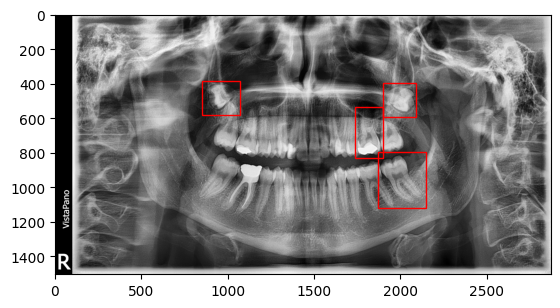

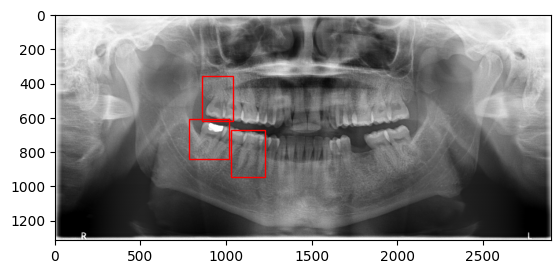

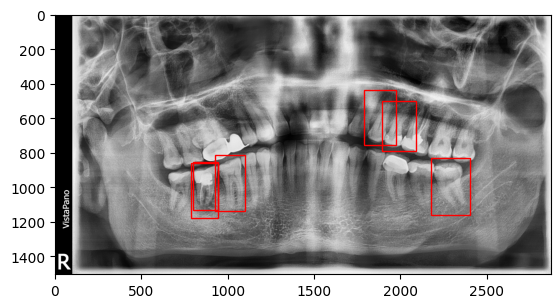

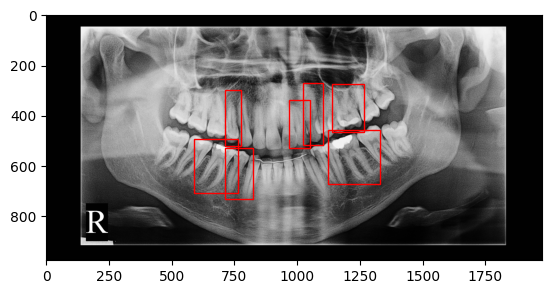

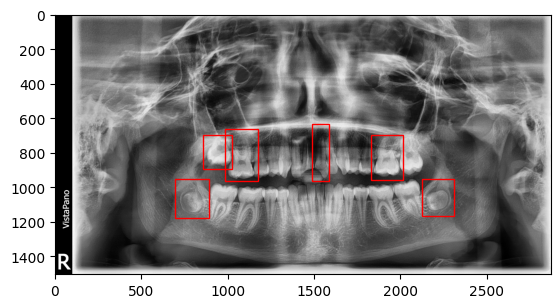

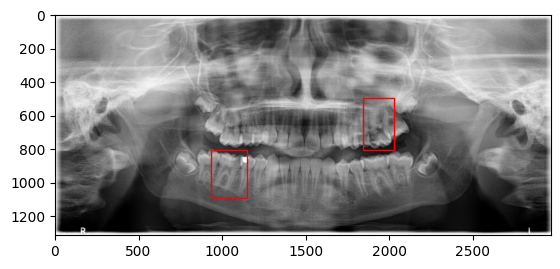

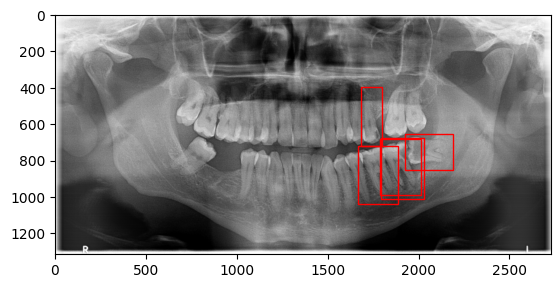

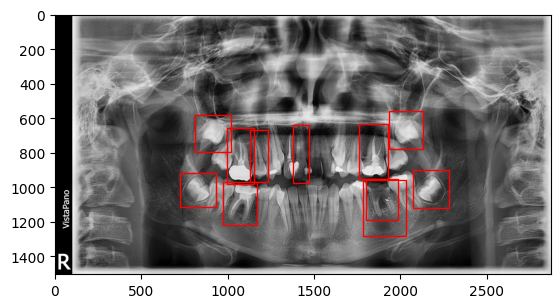

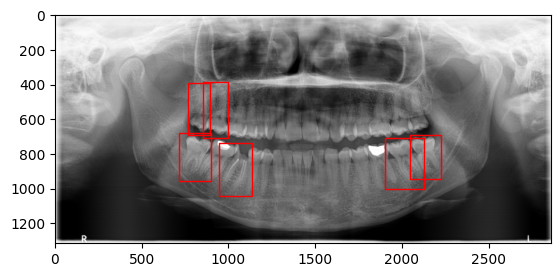

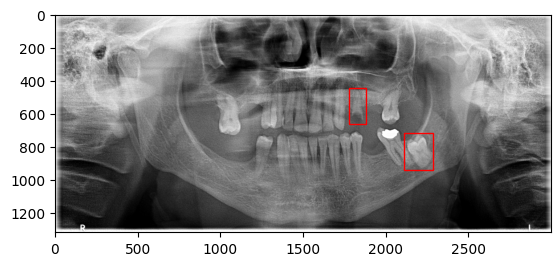

In [ ]:
def visualize_yolo_annotations(image_dir, label_dir, num_images=5):
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    for i, image_file in enumerate(image_files[:num_images]):
        img_path = os.path.join(image_dir, image_file)
        label_path = os.path.join(label_dir, os.path.splitext(image_file)[0] + '.txt')

        # Check if the label file exists
        if not os.path.exists(label_path):
            print(f"Label file does not exist: {label_path}")
            continue

        image = Image.open(img_path)
        fig, ax = plt.subplots(1)
        ax.imshow(image)

        with open(label_path, 'r') as f:
            annotations = f.readlines()

        for annotation in annotations:
            label, x_center, y_center, width, height = map(float, annotation.strip().split())
            x_center *= image.width
            y_center *= image.height
            width *= image.width
            height *= image.height

            # Calculate the coordinates for the bounding box
            x_min = x_center - width / 2
            y_min = y_center - height / 2

            # Create a Rectangle patch
            rect = patches.Rectangle((x_min, y_min), width, height, linewidth=1, edgecolor='r', facecolor='none')

            # Add the patch to the Axes
            ax.add_patch(rect)

        plt.show()

# Visualise some images of the training set
visualize_yolo_annotations('yolo_train_images', 'yolo_train_images')

# Visualising some images of the validation set
visualize_yolo_annotations('yolo_val_images', 'yolo_val_images')

# 5.Training
The YOLOv8 model was used for dental disease detection training. It is divided into several main steps: loading the pre-trained model, configuring the training parameters and starting the training process.

First, the code imports the YOLO library, selecting the YOLO module from the `ultralytics` library.YOLO (You Only Look Once) is an efficient real-time object detection system, and the YOLOv8 version is used here.

Next, the code loads a pre-trained YOLOv8 model. The weight file for the pre-trained model is `yolov8n.pt`, which provides some basic feature extraction capabilities for fast training and convergence with less data and time cost.

The code then configures the training parameters. These parameters include:
- Data configuration file path: the `teeth_disease_data.yaml` file containing the paths to the training and validation sets and label information is specified.
- Input image size: set to 640 pixels.
- Total number of rounds for training: set to 150 rounds.
- Batch size per training: set to 16.
- Number of threads for data loading: set to 8.
- Name of the project: specified as `TeethDiseaseDetection`.
- Name of the training task: specified as `yolov8`.

Finally, the code initiates the training process for the YOLO model. By calling the training method and passing the configured parameters, the model will be trained for the specified number of rounds and its performance on the validation set will be evaluated during the training process.

To summarise, this code implements the complete training process for dental disease detection using YOLOv8. It allows for fast and efficient training of a dental disease detection model by loading a pre-trained model, configuring the training parameters and initiating training. This process includes data preparation, model loading, parameter configuration and training execution, which are standard steps in deep learning model training. The final trained model can be used for dental disease detection to help automate the identification and classification of dental lesions and improve diagnostic efficiency and accuracy.

In [ ]:
from ultralytics import YOLO

# Loading pre-trained models
model = YOLO('yolov8n.pt')

# Configuring Training Parameters
train_params = {
    'data': 'teeth_disease_data.yaml',  # Data Profile Path
    'imgsz': 640,
    'epochs': 150,
    'batch': 16,
    'workers': 8,
    'project': 'TeethDiseaseDetection',
    'name': 'yolov8'
}

# Start training
model.train(**train_params)


100%|██████████| 6.23M/6.23M [00:00<00:00, 557MB/s]

Ultralytics YOLOv8.2.68 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)


engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=teeth_disease_data.yaml, epochs=150, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=TeethDiseaseDetection, name=yolov8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=

train: Scanning /home/featurize/work/yolo_train_images... 678 images, 0 backgrounds, 0 corrupt: 100%|██████████| 678/678 [00:05<00:00, 119.37it/s]

train: WARNING ⚠️ /home/featurize/work/yolo_train_images/train_377.png: 1 duplicate labels removed
train: New cache created: /home/featurize/work/yolo_train_images.cache



val: Scanning /home/featurize/work/yolo_val_images... 46 images, 0 backgrounds, 0 corrupt: 100%|██████████| 46/46 [00:00<00:00, 106.65it/s]

val: New cache created: /home/featurize/work/yolo_val_images.cache


Plotting labels to TeethDiseaseDetection/yolov8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to TeethDiseaseDetection/yolov8
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      2.37G      1.785      3.411      1.389         45        640: 100%|██████████| 43/43 [00:07<00:00,  5.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.92it/s]

                   all         46        182    0.00966      0.525     0.0684      0.037



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      2.34G      1.344      2.149      1.114         68        640: 100%|██████████| 43/43 [00:04<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.57it/s]


                   all         46        182      0.722      0.246      0.264      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      2.31G      1.285      1.961        1.1         50        640: 100%|██████████| 43/43 [00:04<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.07it/s]

                   all         46        182      0.711      0.315      0.264      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      2.38G      1.288      1.931      1.096         54        640: 100%|██████████| 43/43 [00:04<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.29it/s]

                   all         46        182       0.49      0.413      0.273      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      2.35G      1.256      1.867      1.096         50        640: 100%|██████████| 43/43 [00:04<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.54it/s]


                   all         46        182      0.558      0.399      0.314      0.193

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      2.27G      1.224      1.823      1.082         38        640: 100%|██████████| 43/43 [00:08<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.81it/s]

                   all         46        182      0.633      0.341      0.338      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      2.36G      1.221      1.786      1.083         42        640: 100%|██████████| 43/43 [00:04<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.05it/s]

                   all         46        182      0.521      0.471      0.359       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      2.32G      1.214      1.726       1.07         92        640: 100%|██████████| 43/43 [00:04<00:00,  9.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.24it/s]


                   all         46        182      0.543      0.451       0.35      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      2.35G      1.179      1.653      1.066         58        640: 100%|██████████| 43/43 [00:07<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.74it/s]

                   all         46        182      0.531      0.504      0.409      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      2.31G      1.213      1.665      1.078         43        640: 100%|██████████| 43/43 [00:09<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.33it/s]

                   all         46        182      0.597      0.481      0.388      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      2.38G      1.172      1.607      1.067         59        640: 100%|██████████| 43/43 [00:05<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.56it/s]

                   all         46        182      0.552      0.486      0.381      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150       2.4G      1.164      1.593      1.056         59        640: 100%|██████████| 43/43 [00:04<00:00,  9.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.59it/s]

                   all         46        182      0.411      0.544      0.402       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      2.34G      1.168      1.555      1.058         52        640: 100%|██████████| 43/43 [00:04<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.73it/s]

                   all         46        182      0.502       0.55      0.414       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      2.35G      1.162      1.535      1.049         93        640: 100%|██████████| 43/43 [00:05<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.81it/s]

                   all         46        182      0.612       0.47      0.422      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      2.37G      1.153      1.491      1.056        111        640: 100%|██████████| 43/43 [00:04<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.18it/s]

                   all         46        182      0.575      0.491      0.415      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      2.33G      1.156      1.535      1.062         42        640: 100%|██████████| 43/43 [00:04<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.92it/s]

                   all         46        182      0.546      0.598      0.494       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      2.37G      1.134      1.489      1.046         76        640: 100%|██████████| 43/43 [00:04<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.88it/s]

                   all         46        182      0.402       0.57      0.433      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      2.42G      1.131      1.471      1.042         93        640: 100%|██████████| 43/43 [00:05<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.02it/s]

                   all         46        182      0.399      0.524       0.43      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      2.38G      1.113      1.444       1.04         60        640: 100%|██████████| 43/43 [00:04<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.06it/s]

                   all         46        182      0.358      0.663       0.46      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150       2.4G      1.125      1.432       1.05         55        640: 100%|██████████| 43/43 [00:04<00:00,  9.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.92it/s]

                   all         46        182      0.395      0.478      0.422      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      2.35G      1.119      1.422       1.04         55        640: 100%|██████████| 43/43 [00:08<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.64it/s]

                   all         46        182      0.435      0.519      0.428      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      2.34G      1.107      1.436      1.045         56        640: 100%|██████████| 43/43 [00:04<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 12.06it/s]

                   all         46        182      0.385      0.547      0.431      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      2.36G      1.095      1.406      1.039         41        640: 100%|██████████| 43/43 [00:28<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.76it/s]

                   all         46        182      0.368      0.612      0.439      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      2.32G      1.098      1.416      1.041         39        640: 100%|██████████| 43/43 [00:06<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.12it/s]

                   all         46        182      0.527      0.494      0.458      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      2.35G        1.1      1.396      1.031         60        640: 100%|██████████| 43/43 [00:04<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.33it/s]

                   all         46        182      0.419      0.544      0.461      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      2.32G      1.099      1.383      1.029         29        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.89it/s]

                   all         46        182      0.424      0.615       0.44      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      2.38G      1.075      1.364      1.031         43        640: 100%|██████████| 43/43 [00:04<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.52it/s]

                   all         46        182      0.457      0.653      0.472      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      2.35G      1.096       1.35      1.032         60        640: 100%|██████████| 43/43 [00:05<00:00,  8.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.30it/s]

                   all         46        182      0.508      0.443      0.461        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      2.37G      1.086       1.33      1.033         42        640: 100%|██████████| 43/43 [00:23<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.70it/s]

                   all         46        182      0.637      0.508      0.506      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      2.31G      1.077      1.346      1.026         89        640: 100%|██████████| 43/43 [00:05<00:00,  8.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 12.78it/s]

                   all         46        182      0.489      0.468      0.458      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      2.37G      1.072      1.308      1.036         92        640: 100%|██████████| 43/43 [00:04<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.98it/s]

                   all         46        182      0.665      0.467      0.453        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      2.38G      1.064      1.331      1.016         51        640: 100%|██████████| 43/43 [00:24<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.72it/s]

                   all         46        182      0.491      0.542      0.463      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      2.34G      1.042      1.322      1.016         45        640: 100%|██████████| 43/43 [00:04<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.47it/s]

                   all         46        182      0.645      0.445      0.481      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      2.37G      1.039      1.287      1.014         57        640: 100%|██████████| 43/43 [00:04<00:00,  8.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.37it/s]


                   all         46        182      0.546      0.536      0.522       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      2.35G      1.042      1.278      1.017         44        640: 100%|██████████| 43/43 [00:25<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.48it/s]

                   all         46        182      0.404      0.614      0.461      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      2.24G      1.034      1.297      1.019         43        640: 100%|██████████| 43/43 [00:06<00:00,  6.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.32it/s]

                   all         46        182      0.432      0.576      0.468      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      2.29G       1.04      1.267      1.012         69        640: 100%|██████████| 43/43 [00:04<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.98it/s]


                   all         46        182      0.561      0.478      0.451      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      2.35G      1.024      1.252      1.006         32        640: 100%|██████████| 43/43 [00:15<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.82it/s]

                   all         46        182      0.549      0.551      0.521      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      2.37G      1.038      1.245      1.003         52        640: 100%|██████████| 43/43 [00:06<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.80it/s]

                   all         46        182      0.447      0.669      0.455      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      2.29G      1.047      1.251      1.018         52        640: 100%|██████████| 43/43 [00:04<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.55it/s]

                   all         46        182      0.464      0.509      0.493      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      2.31G      1.028       1.23      1.006         54        640: 100%|██████████| 43/43 [00:04<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.98it/s]

                   all         46        182      0.481       0.57      0.494      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      2.26G      1.019      1.205      1.006         46        640: 100%|██████████| 43/43 [00:04<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.41it/s]

                   all         46        182      0.409      0.624      0.495      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      2.37G      1.011      1.196     0.9962         91        640: 100%|██████████| 43/43 [00:04<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.63it/s]

                   all         46        182      0.495      0.486      0.461      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      2.39G      1.015      1.219      1.006         66        640: 100%|██████████| 43/43 [00:04<00:00,  8.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.95it/s]

                   all         46        182      0.377      0.577      0.438      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      2.35G      1.004      1.182     0.9985         67        640: 100%|██████████| 43/43 [00:19<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.73it/s]

                   all         46        182      0.485      0.527      0.493      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      2.33G      1.003      1.172      0.997         23        640: 100%|██████████| 43/43 [00:04<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.21it/s]

                   all         46        182      0.582      0.525      0.515      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      2.31G      1.008      1.184     0.9997         49        640: 100%|██████████| 43/43 [00:04<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.40it/s]

                   all         46        182        0.5      0.474      0.484      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      2.36G       1.01      1.162     0.9883         82        640: 100%|██████████| 43/43 [00:04<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.60it/s]

                   all         46        182      0.421      0.559      0.436      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      2.29G     0.9878      1.148     0.9953         67        640: 100%|██████████| 43/43 [00:04<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.96it/s]

                   all         46        182       0.52      0.459       0.47      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      2.31G       0.97       1.14     0.9883         69        640: 100%|██████████| 43/43 [00:04<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.86it/s]

                   all         46        182        0.6      0.559      0.507      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      2.36G      1.006      1.151     0.9913         85        640: 100%|██████████| 43/43 [00:13<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.12it/s]

                   all         46        182      0.502      0.594      0.503      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      2.36G     0.9731      1.125     0.9901         60        640: 100%|██████████| 43/43 [00:12<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.41it/s]

                   all         46        182       0.44      0.522      0.441      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      2.34G      0.978      1.115     0.9844         45        640: 100%|██████████| 43/43 [00:04<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.20it/s]

                   all         46        182      0.527      0.528      0.509      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150       2.3G     0.9839       1.12     0.9896         48        640: 100%|██████████| 43/43 [00:04<00:00,  8.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.30it/s]


                   all         46        182      0.576       0.51      0.476      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      2.31G     0.9778      1.105     0.9805         69        640: 100%|██████████| 43/43 [00:05<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.96it/s]

                   all         46        182      0.641      0.489      0.518      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      2.29G      0.964      1.102     0.9715         65        640: 100%|██████████| 43/43 [00:04<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.02it/s]

                   all         46        182      0.651      0.505      0.494      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      2.38G     0.9602      1.079     0.9782         69        640: 100%|██████████| 43/43 [00:04<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.25it/s]

                   all         46        182      0.468      0.563      0.517      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      2.31G     0.9386      1.073     0.9758         69        640: 100%|██████████| 43/43 [00:04<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.78it/s]

                   all         46        182      0.452      0.583      0.471      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      2.35G     0.9636       1.07     0.9804         58        640: 100%|██████████| 43/43 [00:04<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.95it/s]

                   all         46        182      0.547      0.558      0.503      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      2.31G      0.976       1.07     0.9798         54        640: 100%|██████████| 43/43 [00:04<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.64it/s]

                   all         46        182      0.451      0.524      0.464      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      2.38G      0.955      1.042     0.9713         45        640: 100%|██████████| 43/43 [00:07<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.93it/s]

                   all         46        182      0.505      0.563      0.477      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      2.32G     0.9489      1.036     0.9706         52        640: 100%|██████████| 43/43 [00:13<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.87it/s]

                   all         46        182      0.467      0.576      0.464      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      2.31G     0.9556      1.027     0.9772         44        640: 100%|██████████| 43/43 [00:05<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.78it/s]

                   all         46        182      0.509      0.562      0.486      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150       2.3G     0.9424      1.024     0.9697         55        640: 100%|██████████| 43/43 [00:04<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.61it/s]

                   all         46        182      0.408      0.489      0.416      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      2.29G     0.9284      1.018     0.9589         68        640: 100%|██████████| 43/43 [00:04<00:00,  8.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.97it/s]

                   all         46        182       0.49      0.488      0.469      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      2.33G      0.919      1.001     0.9656        105        640: 100%|██████████| 43/43 [00:04<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.96it/s]

                   all         46        182      0.483      0.506      0.465      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150       2.3G     0.9366      1.016      0.965         69        640: 100%|██████████| 43/43 [00:04<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.40it/s]

                   all         46        182      0.507      0.447      0.447      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      2.29G     0.9357     0.9989     0.9671         40        640: 100%|██████████| 43/43 [00:08<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.96it/s]

                   all         46        182      0.554      0.475      0.476      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      2.46G     0.9353     0.9897     0.9708         51        640: 100%|██████████| 43/43 [00:05<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.43it/s]

                   all         46        182      0.473      0.544      0.483      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      2.27G     0.9075     0.9521     0.9503         65        640: 100%|██████████| 43/43 [00:04<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.03it/s]

                   all         46        182      0.574      0.439      0.485      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      2.39G     0.9229     0.9773     0.9621         49        640: 100%|██████████| 43/43 [00:04<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.00it/s]


                   all         46        182      0.617      0.462      0.483      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      2.32G      0.918     0.9619     0.9541         76        640: 100%|██████████| 43/43 [00:07<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.61it/s]


                   all         46        182      0.432      0.586      0.458        0.3

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150       2.3G     0.9034     0.9447     0.9543         58        640: 100%|██████████| 43/43 [00:04<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.61it/s]

                   all         46        182      0.468      0.481      0.433      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      2.34G     0.9139     0.9555     0.9583         59        640: 100%|██████████| 43/43 [00:04<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.36it/s]


                   all         46        182      0.513      0.482      0.465      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      2.35G     0.9075     0.9462     0.9543         52        640: 100%|██████████| 43/43 [00:04<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.48it/s]

                   all         46        182      0.451      0.517      0.448      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      2.36G     0.9111     0.9469     0.9481         67        640: 100%|██████████| 43/43 [00:04<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.64it/s]

                   all         46        182       0.56      0.496      0.502      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      2.27G     0.9012     0.9223     0.9514         55        640: 100%|██████████| 43/43 [00:06<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.77it/s]

                   all         46        182      0.518      0.501      0.462      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      2.33G     0.8801     0.9075     0.9473         44        640: 100%|██████████| 43/43 [00:35<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.37it/s]

                   all         46        182      0.495      0.479       0.45      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      2.33G     0.8872      0.902     0.9408         53        640: 100%|██████████| 43/43 [00:05<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.37it/s]

                   all         46        182       0.47      0.584      0.486      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      2.32G     0.8993     0.9002     0.9481         75        640: 100%|██████████| 43/43 [00:04<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.61it/s]

                   all         46        182      0.428      0.537      0.435      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      2.28G     0.8824     0.8993     0.9429         72        640: 100%|██████████| 43/43 [00:05<00:00,  8.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.81it/s]

                   all         46        182      0.454      0.502      0.472      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      2.34G     0.8998     0.8968     0.9508         62        640: 100%|██████████| 43/43 [00:04<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.71it/s]

                   all         46        182      0.444      0.525      0.459      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      2.37G     0.8733     0.8727     0.9422         59        640: 100%|██████████| 43/43 [00:04<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.19it/s]

                   all         46        182      0.488      0.525      0.447      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      2.31G     0.8824     0.8838     0.9469         65        640: 100%|██████████| 43/43 [00:04<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.35it/s]

                   all         46        182       0.41      0.544      0.475      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      2.29G     0.8675     0.8548      0.936         70        640: 100%|██████████| 43/43 [00:04<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.41it/s]

                   all         46        182      0.533      0.482      0.493      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      2.33G     0.8521     0.8596      0.932         92        640: 100%|██████████| 43/43 [00:04<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.55it/s]

                   all         46        182      0.537      0.457      0.454      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      2.35G     0.8695     0.8518      0.933         96        640: 100%|██████████| 43/43 [00:05<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.57it/s]

                   all         46        182       0.51      0.451      0.453      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      2.35G     0.8603     0.8454     0.9366         43        640: 100%|██████████| 43/43 [00:04<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.69it/s]

                   all         46        182      0.443      0.534      0.485      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      2.27G     0.8542     0.8304     0.9323         81        640: 100%|██████████| 43/43 [00:04<00:00,  8.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.51it/s]

                   all         46        182      0.573      0.485      0.486      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      2.34G     0.8471     0.8131     0.9304         92        640: 100%|██████████| 43/43 [00:04<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.91it/s]

                   all         46        182      0.576      0.476       0.49      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      2.29G     0.8626     0.8224      0.933         80        640: 100%|██████████| 43/43 [00:04<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.41it/s]

                   all         46        182      0.431      0.562      0.475      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      2.36G     0.8398     0.8042     0.9314         81        640: 100%|██████████| 43/43 [00:05<00:00,  7.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.11it/s]

                   all         46        182      0.483      0.553      0.491       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150       2.3G     0.8543     0.8161     0.9349         70        640: 100%|██████████| 43/43 [00:04<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.38it/s]

                   all         46        182      0.483      0.511      0.481      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      2.35G     0.8435     0.7856     0.9289         63        640: 100%|██████████| 43/43 [00:04<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.20it/s]

                   all         46        182      0.506      0.486      0.483      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150       2.3G      0.849     0.8008     0.9311         65        640: 100%|██████████| 43/43 [00:04<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 14.88it/s]

                   all         46        182      0.448      0.556      0.456        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      2.25G     0.8461     0.7888     0.9328         43        640: 100%|██████████| 43/43 [00:04<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.28it/s]

                   all         46        182      0.486      0.499      0.483       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      2.35G     0.8451     0.7784     0.9344         27        640: 100%|██████████| 43/43 [00:04<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.92it/s]

                   all         46        182       0.48      0.462      0.464      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      2.27G     0.8338     0.7799      0.929         98        640: 100%|██████████| 43/43 [00:04<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.72it/s]

                   all         46        182      0.474      0.506       0.49      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      2.38G     0.8268     0.7624     0.9241         56        640: 100%|██████████| 43/43 [00:04<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.46it/s]

                   all         46        182      0.597      0.466       0.49      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      2.35G      0.825      0.777     0.9223         68        640: 100%|██████████| 43/43 [00:04<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.22it/s]

                   all         46        182      0.632      0.472      0.495      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      2.28G     0.8249     0.7633     0.9237         76        640: 100%|██████████| 43/43 [00:04<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.02it/s]

                   all         46        182      0.517      0.551      0.482      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      2.35G     0.8213     0.7589     0.9212         72        640: 100%|██████████| 43/43 [00:04<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.48it/s]

                   all         46        182      0.567       0.48      0.485      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      2.29G     0.8287     0.7649     0.9214         52        640: 100%|██████████| 43/43 [00:04<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.11it/s]

                   all         46        182      0.586      0.496      0.469      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      2.31G     0.8198     0.7318     0.9189         77        640: 100%|██████████| 43/43 [00:08<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.04it/s]

                   all         46        182      0.433      0.568      0.468      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      2.34G     0.8108     0.7368     0.9194         58        640: 100%|██████████| 43/43 [00:04<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.59it/s]

                   all         46        182      0.574      0.483      0.462      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      2.34G     0.8147     0.7366     0.9162         60        640: 100%|██████████| 43/43 [00:04<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.14it/s]

                   all         46        182      0.501       0.54       0.47      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      2.32G     0.8155     0.7226     0.9209         78        640: 100%|██████████| 43/43 [00:08<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.37it/s]

                   all         46        182      0.477      0.516       0.45      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      2.36G     0.8107     0.7304     0.9152         58        640: 100%|██████████| 43/43 [00:04<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.66it/s]

                   all         46        182      0.553      0.446      0.476      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      2.37G     0.7988      0.727     0.9151         65        640: 100%|██████████| 43/43 [00:04<00:00,  9.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.49it/s]

                   all         46        182      0.482      0.523      0.492      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      2.34G      0.815     0.7379     0.9135         53        640: 100%|██████████| 43/43 [00:05<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.66it/s]

                   all         46        182      0.532      0.507      0.481      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      2.33G     0.8009     0.7152     0.9166         71        640: 100%|██████████| 43/43 [00:04<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.93it/s]


                   all         46        182       0.56      0.474      0.485      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      2.38G     0.7985     0.7126     0.9132         95        640: 100%|██████████| 43/43 [00:04<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.63it/s]

                   all         46        182       0.69      0.498       0.48      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150       2.3G     0.8063     0.6897     0.9139         84        640: 100%|██████████| 43/43 [00:04<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.59it/s]

                   all         46        182      0.524      0.535      0.482      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      2.38G     0.7949     0.7071     0.9139         55        640: 100%|██████████| 43/43 [00:04<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.84it/s]

                   all         46        182      0.493      0.504      0.488      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      2.31G     0.7852     0.6992     0.9057         59        640: 100%|██████████| 43/43 [00:04<00:00,  9.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.21it/s]

                   all         46        182      0.521      0.478      0.478      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150       2.3G     0.7899     0.6934     0.9071         34        640: 100%|██████████| 43/43 [00:04<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.75it/s]

                   all         46        182      0.486      0.556      0.484      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150       2.3G     0.7808       0.69     0.9064         50        640: 100%|██████████| 43/43 [00:04<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.70it/s]

                   all         46        182      0.676      0.438      0.479      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      2.34G     0.7733     0.6698     0.9033         62        640: 100%|██████████| 43/43 [00:04<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.03it/s]

                   all         46        182      0.443      0.565      0.479      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      2.29G     0.7776     0.6774     0.9075         51        640: 100%|██████████| 43/43 [00:04<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.16it/s]

                   all         46        182      0.479       0.53      0.475      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150       2.3G     0.7857     0.6734     0.9079         69        640: 100%|██████████| 43/43 [00:04<00:00,  9.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.83it/s]

                   all         46        182      0.602      0.458      0.489      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150       2.3G     0.7856     0.6748     0.9067         52        640: 100%|██████████| 43/43 [00:04<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.41it/s]

                   all         46        182      0.613      0.439      0.483      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      2.28G     0.7745     0.6727     0.9057         43        640: 100%|██████████| 43/43 [00:05<00:00,  8.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 16.07it/s]

                   all         46        182        0.5      0.519      0.487       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      2.35G     0.7778     0.6544     0.9115         49        640: 100%|██████████| 43/43 [00:04<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.38it/s]

                   all         46        182      0.487      0.535      0.495      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      2.29G     0.7638      0.659        0.9         42        640: 100%|██████████| 43/43 [00:04<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.88it/s]

                   all         46        182      0.649       0.46      0.489      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      2.35G     0.7579      0.643     0.8991         44        640: 100%|██████████| 43/43 [00:04<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.17it/s]

                   all         46        182      0.573      0.498      0.477      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      2.35G     0.7666     0.6474     0.9005         91        640: 100%|██████████| 43/43 [00:04<00:00,  9.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.99it/s]

                   all         46        182      0.519       0.47      0.466      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150       2.3G     0.7674     0.6441      0.899         77        640: 100%|██████████| 43/43 [00:04<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.87it/s]

                   all         46        182      0.515      0.508      0.484       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150       2.3G     0.7619     0.6396     0.8971         58        640: 100%|██████████| 43/43 [00:04<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.65it/s]


                   all         46        182      0.482      0.588      0.491      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      2.29G     0.7623     0.6486     0.9013         73        640: 100%|██████████| 43/43 [00:04<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.32it/s]

                   all         46        182      0.603      0.459      0.474      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      2.27G     0.7533     0.6218     0.9027         46        640: 100%|██████████| 43/43 [00:04<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 18.85it/s]

                   all         46        182      0.513      0.496      0.487      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      2.35G     0.7442     0.6296     0.8953         28        640: 100%|██████████| 43/43 [00:05<00:00,  8.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 15.90it/s]

                   all         46        182      0.574      0.464      0.473      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      2.29G      0.746     0.6287     0.9015         49        640: 100%|██████████| 43/43 [00:04<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.65it/s]

                   all         46        182      0.478      0.527      0.479      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      2.34G     0.7539      0.614      0.894         67        640: 100%|██████████| 43/43 [00:04<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.07it/s]

                   all         46        182      0.702      0.424      0.479      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      2.32G     0.7418     0.6116     0.8987         52        640: 100%|██████████| 43/43 [00:04<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 17.79it/s]

                   all         46        182      0.655      0.444      0.485      0.307


EarlyStopping: Training stopped early as no improvement observed in last 100 epochs. Best results observed at epoch 34, best model saved as best.pt.
To update EarlyStopping(patience=100) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

134 epochs completed in 0.267 hours.
Optimizer stripped from TeethDiseaseDetection/yolov8/weights/last.pt, 6.2MB
Optimizer stripped from TeethDiseaseDetection/yolov8/weights/best.pt, 6.2MB

Validating TeethDiseaseDetection/yolov8/weights/best.pt...
Ultralytics YOLOv8.2.68 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4090, 24217MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.94it/s]


                   all         46        182      0.546      0.536      0.521      0.339
                Caries         16         40      0.687      0.879      0.879      0.554
           Deep Caries         37        101      0.285      0.485      0.328      0.222
              Impacted          7          9      0.542      0.333      0.333      0.197
     Periapical Lesion         20         32      0.671      0.447      0.543      0.382
Speed: 0.4ms preprocess, 0.3ms inference, 0.0ms loss, 0.5ms postprocess per image
Results saved to TeethDiseaseDetection/yolov8


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fd6bd8723e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

# 6. Results

## Importing the Necessary Libraries

Firstly, the code imports the necessary library modules including `os`, `pandas`, and `matplotlib`. `os` is used to handle the file paths, `pandas` is used to read and process the CSV files, and `matplotlib` is used to draw the graphs.

## Defining a Function to Load YOLOv8 Training Results

The code defines a function named `load_yolov8_results` to load the training results file `results.csv` from a specified directory. If the file does not exist, the function prints an error message and returns `None`. If the file exists, it reads and returns the contents of the file, which is stored in a Pandas data frame.

## Defining a Function to Visualize YOLOv8 Training Results

The code defines another function called `plot_yolov8_results` to visualize YOLOv8 training results. The function first checks if the input is `None`, and if it is, it returns it directly. Otherwise, it continues to process the data and plot the graph.

### Remove Redundant Spaces in Column Names

Ensures that there are no redundant spaces in the column names of the data frame for subsequent processing.

### Extract Training Cycles and Various Performance Metrics

- Extract training cycles (epochs).
- Extract box loss and classification loss for training and validation sets.
- Extract precision, recall, mean accuracy (mAP) and mAP at different IOU thresholds.
- Calculate the F1 score.

### Plotting Graphs

The code uses `matplotlib` to plot multiple subgraphs, each showing the change in different performance metrics over training cycles.

- The first subplot shows precision and recall.
- The second subplot shows mAP50 and mAP50-95.
- The third subplot shows frame loss for the training and validation sets.
- The fourth subplot shows classification loss for the training and validation sets.
- The fifth subplot shows the F1 score.

## Load and Visualize YOLOv8 Training Results

Finally, the code calls the `load_yolov8_results` function to load the training results and the `plot_yolov8_results` function to generate and display the graphs. This step includes:

- Specifying the directory where the results file is located.
- Reading the results file.
- Using the read data to generate a chart showing the changes in the metrics during the training process.

## Summary

This code provides a visualization of the performance of the YOLOv8 model during training. The trend of various performance metrics (such as precision, recall, loss function, and F1 score) with the training cycle can help evaluate the training effect of the model and provide a reference for the optimization and improvement of the model.

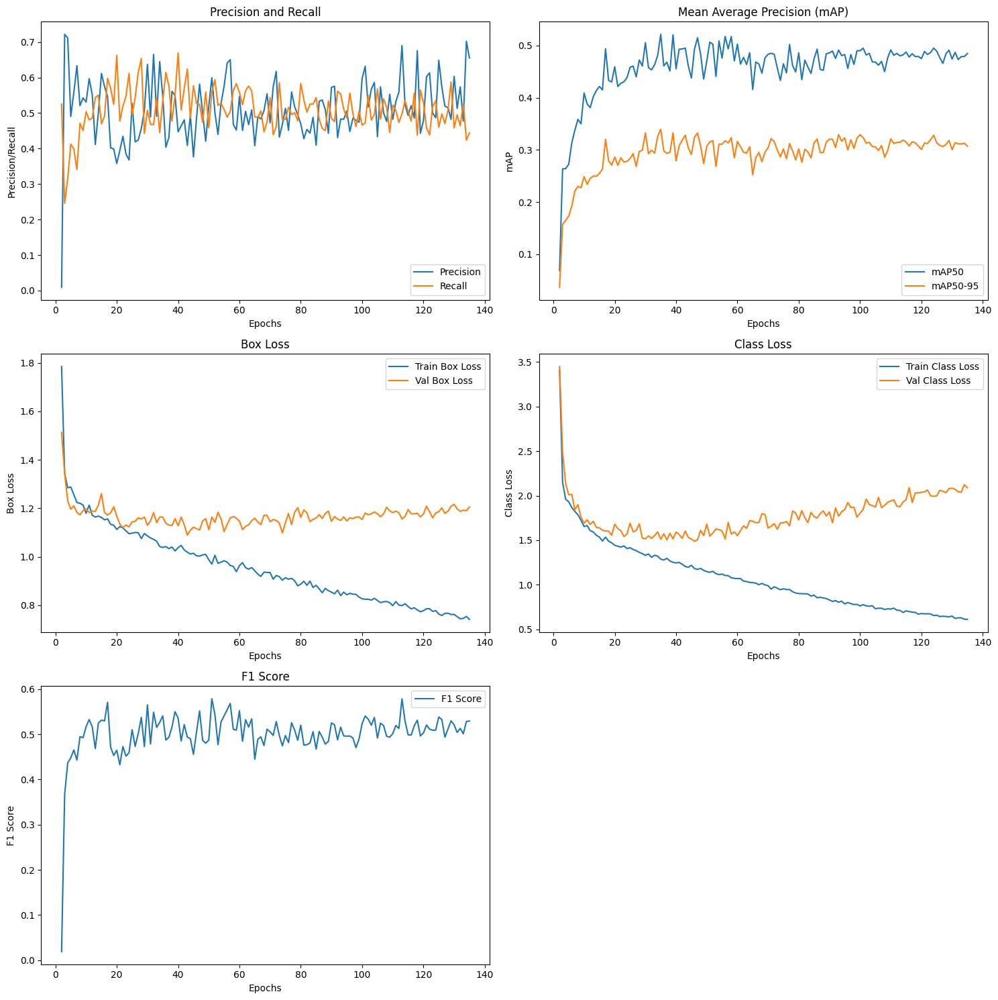

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

def load_yolov8_results(logdir):
    results_path = os.path.join(logdir, 'results.csv')
    if not os.path.exists(results_path):
        print(f"No results.csv found at {results_path}")
        return None

    results = pd.read_csv(results_path)
    return results

def plot_yolov8_results(results):
    if results is None:
        return

    # Remove extra spaces from column names
    results.columns = results.columns.str.strip()

    epochs = results['epoch'] + 1
    train_box_loss = results['train/box_loss']
    val_box_loss = results['val/box_loss']
    train_cls_loss = results['train/cls_loss']
    val_cls_loss = results['val/cls_loss']
    precision = results['metrics/precision(B)']
    recall = results['metrics/recall(B)']
    mAP50 = results['metrics/mAP50(B)']
    mAP50_95 = results['metrics/mAP50-95(B)']

    # Calculating F1 scores
    f1_score = 2 * (precision * recall) / (precision + recall)

    plt.figure(figsize=(15, 15))

    plt.subplot(3, 2, 1)
    plt.plot(epochs, precision, label='Precision')
    plt.plot(epochs, recall, label='Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Precision/Recall')
    plt.legend()
    plt.title('Precision and Recall')

    plt.subplot(3, 2, 2)
    plt.plot(epochs, mAP50, label='mAP50')
    plt.plot(epochs, mAP50_95, label='mAP50-95')
    plt.xlabel('Epochs')
    plt.ylabel('mAP')
    plt.legend()
    plt.title('Mean Average Precision (mAP)')

    plt.subplot(3, 2, 3)
    plt.plot(epochs, train_box_loss, label='Train Box Loss')
    plt.plot(epochs, val_box_loss, label='Val Box Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Box Loss')
    plt.legend()
    plt.title('Box Loss')

    plt.subplot(3, 2, 4)
    plt.plot(epochs, train_cls_loss, label='Train Class Loss')
    plt.plot(epochs, val_cls_loss, label='Val Class Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Class Loss')
    plt.legend()
    plt.title('Class Loss')

    plt.subplot(3, 2, 5)
    plt.plot(epochs, f1_score, label='F1 Score')
    plt.xlabel('Epochs')
    plt.ylabel('F1 Score')
    plt.legend()
    plt.title('F1 Score')

    plt.tight_layout()
    plt.show()

# Loading and visualising YOLOv8 training results
results = load_yolov8_results('TeethDiseaseDetection/yolov8')
plot_yolov8_results(results)


## Data Directory Definition and Result Directory Creation

Firstly, the code defines the path to the directory where the test images, labels, and results are saved. Subsequently, the result save directory is created using the `os.makedirs` function, or if the directory does not exist, it is created:

## Deleting Invalid JSON Files

The code defines a function `delete_invalid_json_files` to delete invalid JSON files from the labels directory. Invalid files include:

- Files with filenames starting with `._` and files that begin with `.`.
- Tag files whose corresponding image files do not exist.
- JSON files that cannot be decoded correctly (try two encodings: `utf-8` and `latin-1`).

## Loading a Trained Model

The code loads a trained YOLO model with the model weights file as `best.pt` and the path to the specified model directory.

## Define Disease Label Mapping

The code defines a dictionary `disease_mapping` that maps Turkish disease labels to English labels for use in subsequent processing and visualization.

## Reading the Label File

The code defines a function `load_annotations` to read tag files in JSON format. If the file fails to be read using `utf-8` encoding, it tries to read it using `latin-1` encoding.

## Infer and Save the Result

The code defines a function `infer_and_save` for reasoning about a single image and visually comparing the reasoning results with the actual tags. The specific steps are as follows:

1. Use YOLO model to reason over the image and get the prediction result.
2. Read the original image and labels and display the image using `matplotlib`.
3. Draw the bounding box of the actual label on the original image.
4. Draw the bounding box of the prediction result on the other image.
5. Save both images as result image files.

## Batch Process and Save the Result

The code defines a function `infer_and_save_batch` to batch process images in a specified directory. The specific steps are as follows:

1. Get all the image files in the image directory.
2. For each image, read the corresponding label file and image file.
3. Call the `infer_and_save` function to reason over the images and save the results.

## Batch Inference and Save Test Set Results

Finally, the code calls the `infer_and_save_batch` function to perform batch inference on the images in the test set and save the results to the specified directory. During processing, the code processes up to the first 80 images.

## Summary

With this code, it is possible to automate the detection of dental images using the trained YOLO model, and to compare and visualize the results with the actual labels. The process involves deleting invalid label files, loading the trained model, reading labels, performing inference, drawing bounding boxes, and saving the resultant images. In this way, the performance of the model can be visually evaluated, problems in the model can be identified and improved, and the accuracy and reliability of dental disease detection can be improved.

In [ ]:
import os
import json
import random
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.patches as patches

# Defining the data catalogue
test_image_dir = '/home/featurize/data/disease/input'
label_dir = '/home/featurize/data/disease/label'
results_dir = '/home/featurize/data/disease/results'

# Create a directory to save the results
os.makedirs(results_dir, exist_ok=True)

# Functions to remove invalid JSON files
def delete_invalid_json_files(folder_path, image_dir):
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)
        image_file_path = os.path.join(image_dir, os.path.splitext(file_name)[0] + '.png')
        if file_name.endswith('.json'):
            if file_name.startswith('._') or not os.path.exists(image_file_path):
                os.remove(file_path)
                continue
            try:
                with open(file_path, 'r', encoding='utf-8') as f:
                    json.load(f)
            except (UnicodeDecodeError, json.JSONDecodeError):
                try:
                    with open(file_path, 'r', encoding='latin-1') as f:
                        json.load(f)
                except json.JSONDecodeError as e:
                    os.remove(file_path)

# Remove invalid JSON files
delete_invalid_json_files(label_dir, test_image_dir)

# Loading the trained model
model = YOLO('/home/featurize/work/TeethDiseaseDetection/yolov8/weights/best.pt')

# Disease Tag Mapping
disease_mapping = {
    'çürük': 'Caries',
    'deep çürük': 'Deep Caries',
    'impacted': 'Impacted',
    'periapical lezyon': 'Periapical Lesion',
    'gömülü': 'Caries'
}

# Read label file
def load_annotations(annotation_file):
    try:
        with open(annotation_file, 'r', encoding='utf-8') as f:
            annotations = json.load(f)
    except (UnicodeDecodeError, json.JSONDecodeError):
        with open(annotation_file, 'r', encoding='latin-1') as f:
            annotations = json.load(f)
    return annotations

# Reasoning and saving results
def infer_and_save(image_path, annotations, result_path):
    # inference
    results = model(image_path)

    # Read original image and label
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    image = Image.open(image_path)
    width, height = image.size

    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    # Show original image and tags
    axes[0].imshow(img_rgb)
    for annotation in annotations:
        label, points = annotation['label'], annotation['points']
        disease_label = disease_mapping.get(label.split('-')[1], label.split('-')[1])
        x_min = min(point[0] for point in points)
        y_min = min(point[1] for point in points)
        x_max = max(point[0] for point in points)
        y_max = max(point[1] for point in points)
        w = x_max - x_min
        h = y_max - y_min
        rect = patches.Rectangle((x_min, y_min), w, h, linewidth=2, edgecolor='b', facecolor='none')
        axes[0].add_patch(rect)
        axes[0].text(x_min, y_min - 10, f'{disease_label}', color='b', fontsize=12, weight='bold')
    axes[0].set_title('Ground Truth')
    axes[0].axis('off')

    # Display of reasoning results
    axes[1].imshow(img_rgb)
    for result in results:
        boxes = result.boxes
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Get bounding box coordinates
            conf = box.conf[0]  # Getting Confidence
            cls = box.cls[0]  # Get category tags

            # Drawing a bounding box on an image
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            label = f'{model.names[int(cls)]}: {conf:.2f}'
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    axes[1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Predicted')
    axes[1].axis('off')

    plt.tight_layout()
    plt.savefig(result_path)
    plt.close()

# Batch processing and saving results
def infer_and_save_batch(image_dir, label_dir, results_dir, max_images):
    image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    image_files = image_files[:max_images]  # Only the first max_images are processed

    for i, image_file in enumerate(image_files):
        image_path = os.path.join(image_dir, image_file)
        label_path = os.path.join(label_dir, os.path.splitext(image_file)[0] + '.json')
        result_path = os.path.join(results_dir, os.path.splitext(image_file)[0] + '_result.png')

        if os.path.exists(label_path):
            annotations = load_annotations(label_path)
            if annotations:
                shapes = annotations.get('shapes')
                if shapes:
                    infer_and_save(image_path, shapes, result_path)
        elif not os.path.basename(label_path).startswith('._'):
            print(f"Label file does not exist: {label_path}")

# Batch reasoning and saving test set results
infer_and_save_batch(test_image_dir, label_dir, results_dir, max_images=80)


image 1/1 /home/featurize/data/disease/input/test_142.png: 320x640 4 Cariess, 4 Deep Cariess, 6.8ms
Speed: 1.7ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

image 1/1 /home/featurize/data/disease/input/test_43.png: 384x640 1 Caries, 8 Deep Cariess, 1 Periapical Lesion, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /home/featurize/data/disease/input/test_138.png: 320x640 4 Cariess, 1 Deep Caries, 6.6ms
Speed: 1.7ms preprocess, 6.6ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

image 1/1 /home/featurize/data/disease/input/test_17.png: 320x640 3 Deep Cariess, 5.9ms
Speed: 1.4ms preprocess, 5.9ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

image 1/1 /home/featurize/data/disease/input/test_151.png: 320x640 1 Deep Caries, 5.8ms
Speed: 1.4ms preprocess, 5.8ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

image 1/1 /home/feat

## Defining a Function to Display Random Results

Here, we define the `display_random_results` function, which randomly selects and displays a specified number of inference result images from a given directory. The function accepts two arguments:

- `results_dir`: The directory where the inference result images are stored.
- `num_images`: The number of images to be randomly displayed, set to 5 by default.

## Getting Inference Result Files

The code first retrieves all files ending with `_result.png` from the results directory, which are the previously saved inference result images. Then, the `random.sample` function is used to randomly select up to `num_images` of these files. If the number of files in the directory is less than `num_images`, only the number of files that actually exist is selected.

## Displaying Randomly Selected Images

For each randomly selected file, the code performs the following steps:

1. Constructs the path to the image file.
2. Opens the image file using PIL’s `Image.open` method.
3. Displays the image using `matplotlib`. The image is displayed without the axes, and the image size is set to 10x5 inches to better show the details.

## Running the Function

Finally, we call the `display_random_results` function to randomly select and display five inference result images from the results directory.

## Summary

This code provides a convenient way to randomly select and display inference result images, allowing you to visually assess how the model’s inference results compare to the actual labels. This visual inspection helps evaluate the model’s performance, identify areas for improvement, and enhance the model’s accuracy and reliability.

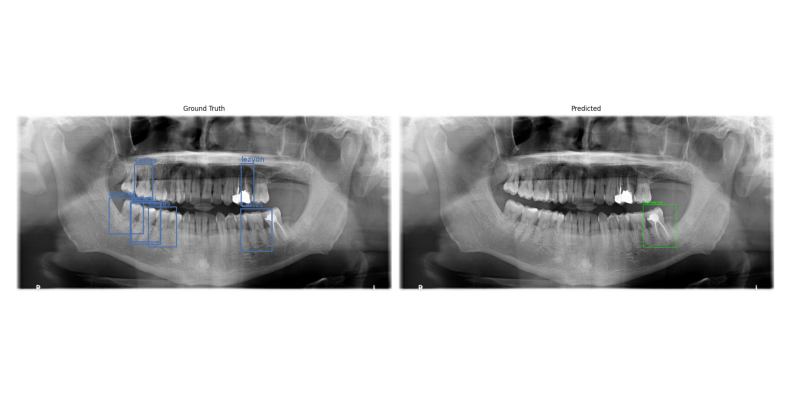

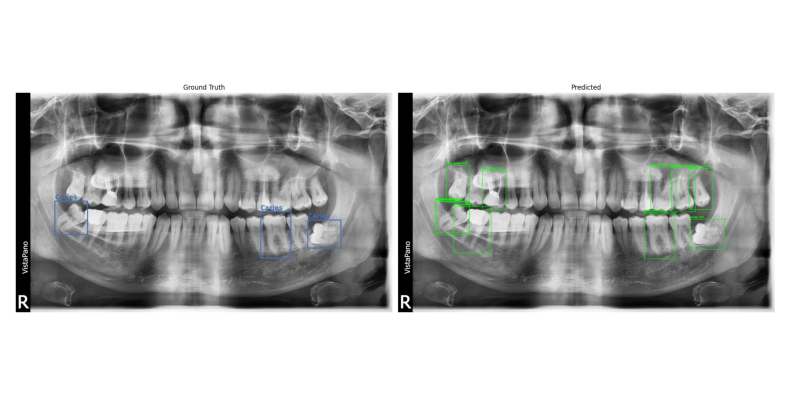

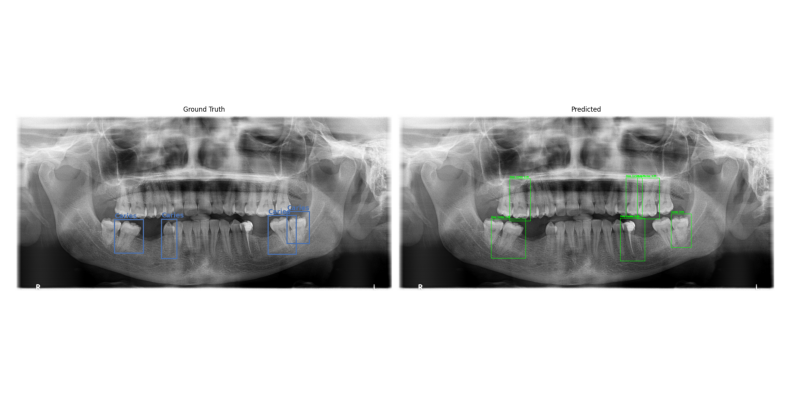

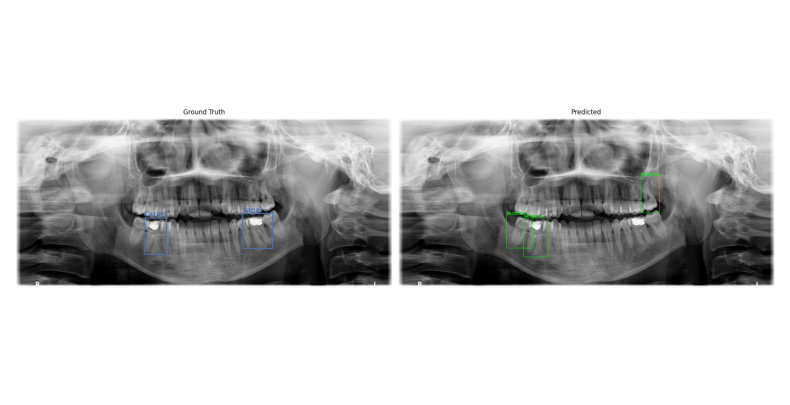

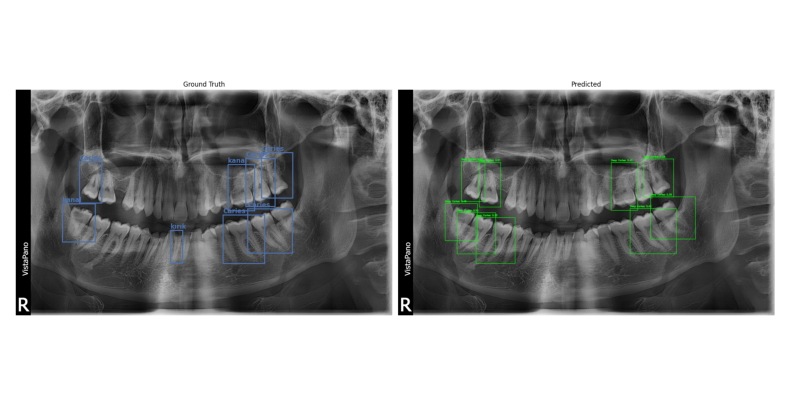

In [ ]:
# Randomly show five comparison results
def display_random_results(results_dir, num_images=5):
    result_files = [f for f in os.listdir(results_dir) if f.lower().endswith('_result.png')]
    random_files = random.sample(result_files, min(num_images, len(result_files)))

    for result_file in random_files:
        img_path = os.path.join(results_dir, result_file)
        img = Image.open(img_path)
        plt.figure(figsize=(10, 5))
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# Randomly show five comparison results
display_random_results(results_dir, num_images=5)

# 7.Discussion

**According to the results in the chart, our model shows many advantages:**

**1.Consistent Precision and Recall:**

Throughout the training process, the model maintained a relatively stable balance between precision and recall. This indicates that our model is capable of correctly identifying a substantial portion of the relevant instances (high recall) while also ensuring that a significant proportion of its positive predictions are accurate (high precision). Such consistency is crucial in applications like dental diagnostics, where both missed detections and false positives can have serious implications.

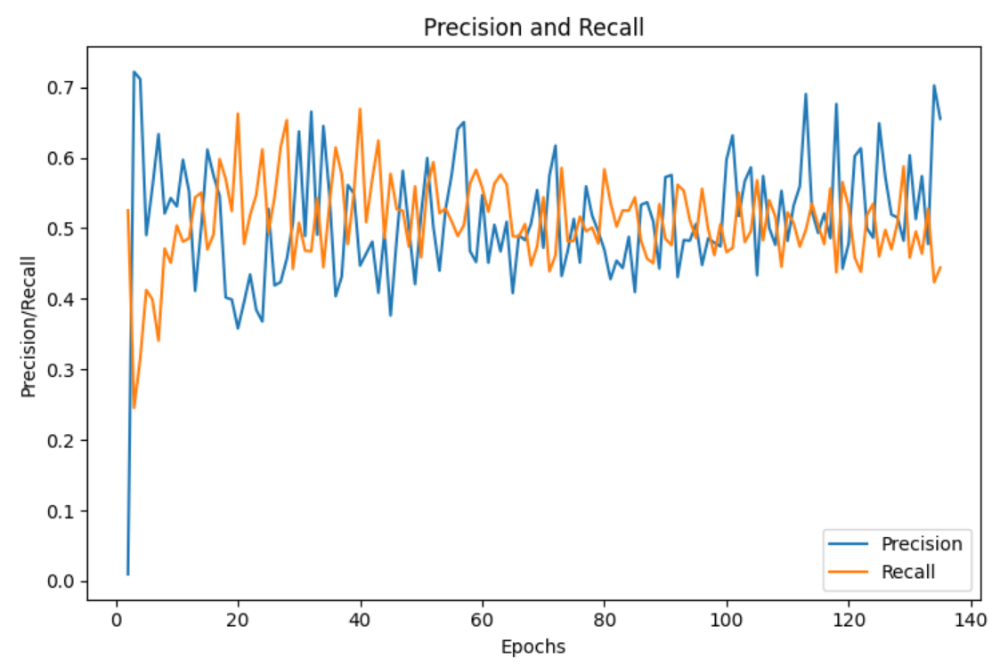

<br>

<br>

**2.Strong mAP50 Performance:**

The model achieved a robust mAP50 score, indicating its high accuracy in detecting objects when a moderate overlap (IoU threshold of 0.5) between the predicted and ground-truth bounding boxes is considered sufficient. This result reflects the model's strong capability to correctly identify and localize objects within the images, ensuring a good balance between precision and recall.

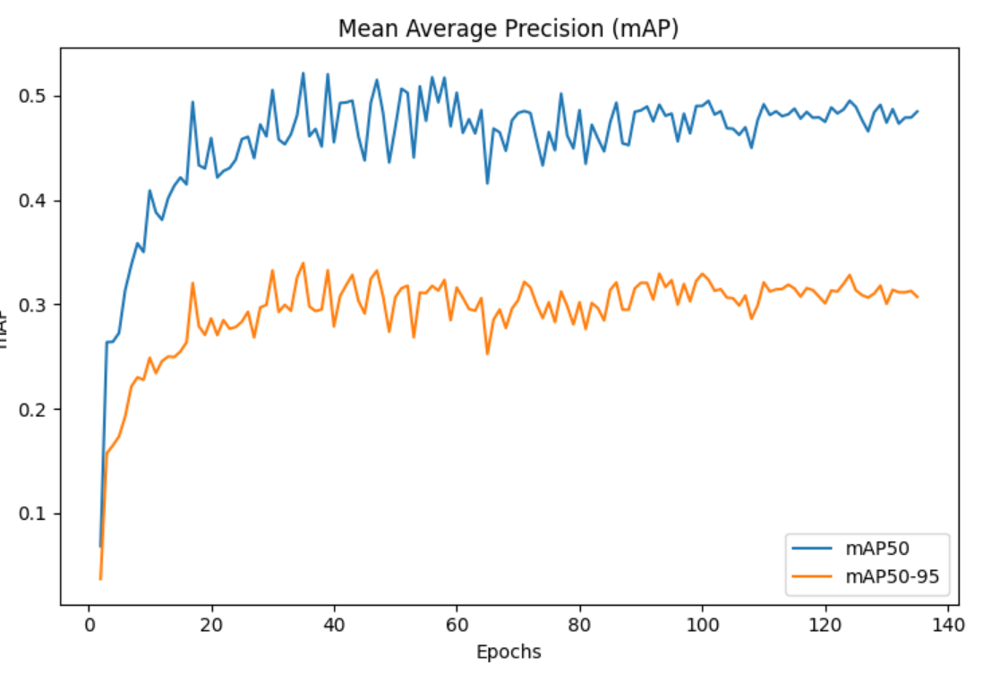

<br>

<br>

**3.Balanced F1 Score:**

The model's F1 score stabilized at a satisfactory level, indicating a good balance between precision and recall. This balanced performance metric is crucial for applications where both false positives and false negatives need to be minimized. A strong F1 score suggests that the model can maintain high overall accuracy, which is essential for reliable and consistent results in real-world applications.

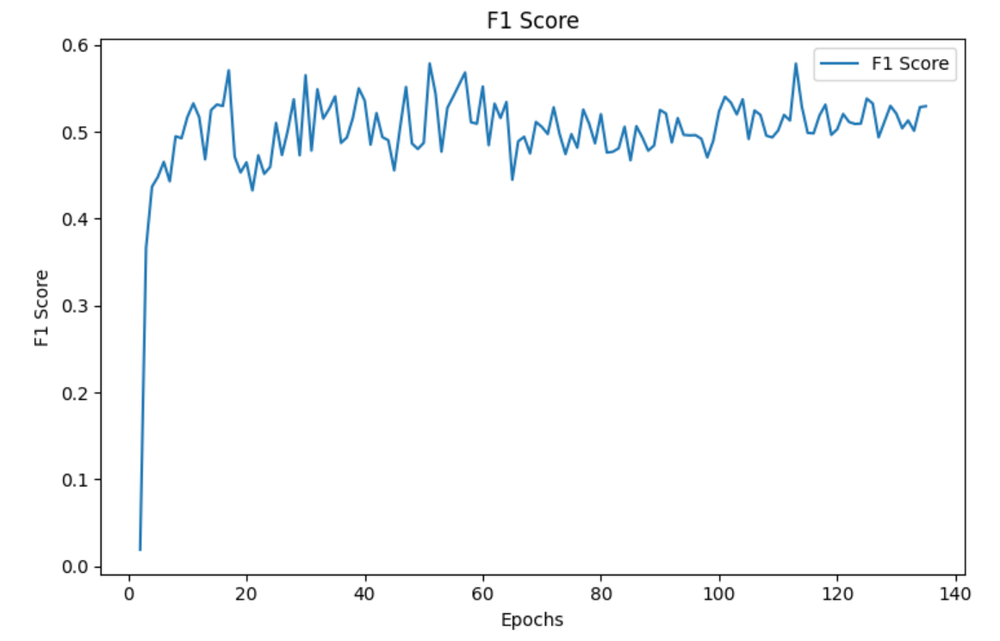

<br>



<br>


**However, there are still many errors in the final prediction map of abnormal teeth. To address these, we propose a set of solutions aimed at enhancing both the quality of our data and the model's overall performance:**
<br><br>
**1.Improve Dataset Quality and Quantity**   
One of the primary factors affecting the model's performance is the dataset. Expanding the dataset by collecting more images, especially for underrepresented classes, can provide the model with a broader range of examples to learn from, thereby improving its generalization capabilities. Additionally, enhancing the quality of the dataset by ensuring accurate and consistent annotations will reduce the likelihood of training on incorrect data, leading to better model accuracy.

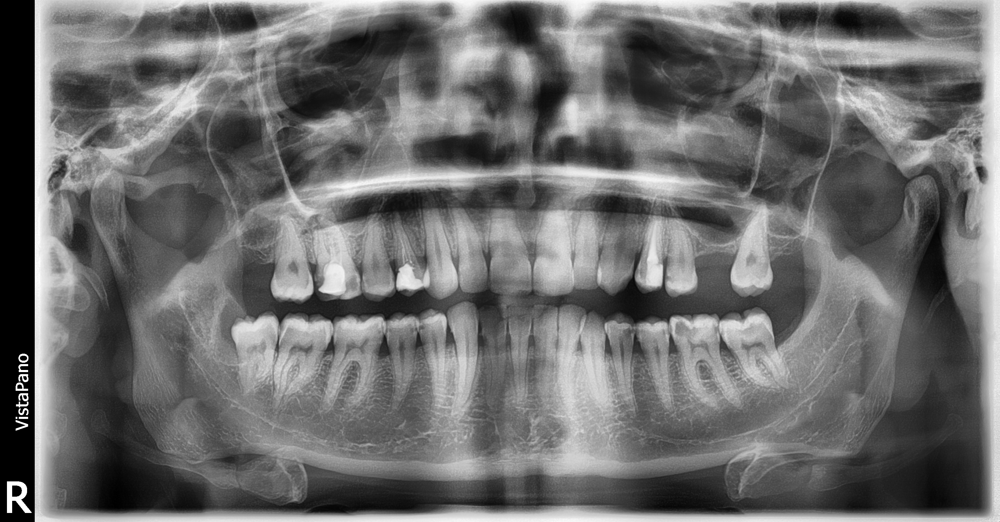

**2. Segmenting Individual Teeth for Training:**

In fact, the model we initially used was Fast-RCNN, and we used the method of segmenting a single tooth for training. However, we encountered some technical difficulties in the evaluation part, so we had to switch to the YOLO model. Due to very limited time, we gave up the more complicated method of segmenting a single tooth and used the whole image analysis to complete the project within the specified time.

Instead of using whole panoramic X-rays, we propose segmenting individual teeth and using these segments for training. This approach can help the model focus on more localized features, making it easier to identify specific dental anomalies. By training on segmented images, the model may better learn the characteristics of different teeth and associated conditions, potentially leading to more precise detections and classifications.

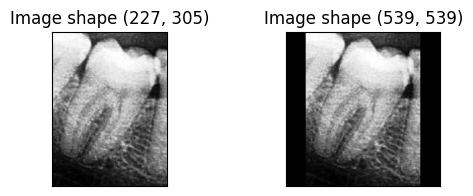

**3.Use a Model with Better Performance:**

In object detection and multi-label classification tasks, using models whose characteristics are more consistent with the experimental design can significantly improve results. For example, using more advanced versions of YOLO, such as YOLOv5 or YOLOv7, or even experimenting with different architectures like EfficientDet or RetinaNet, may provide better accuracy and efficiency. These models incorporate more sophisticated techniques for feature extraction, handling class imbalances, and improving detection accuracy.

In addition, the [HierarchicalDet](https://arxiv.org/abs/2303.06500) model used by Hamamci et al. also showed excellent performance. This model utilizes an image encoder to extract high-level features and a detection decoder to refine initial noisy boxes. By treating object detection as a denoising diffusion process, HierarchicalDet effectively transitions from noisy boxes to accurate object boxes. The model also integrates multi-label object detection using a customized Detectron2 library, designed to handle partially annotated data. Adopting such advanced techniques can potentially enhance the detection accuracy and robustness of our system.

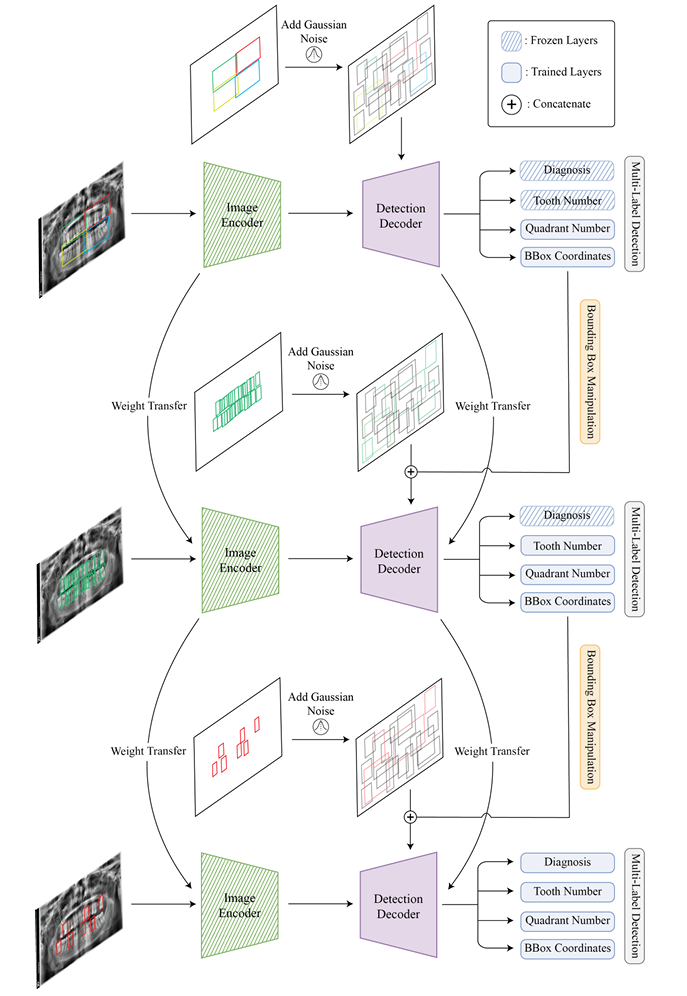

**Summary**  
By implementing these strategies, we aim to overcome the current limitations and enhance the robustness and accuracy of our dental X-ray analysis system. Improving the dataset's quality and size, refining the training process through segmentation, and potentially adopting more advanced models are key steps toward achieving better diagnostic precision and consistency. These improvements will not only boost the model's test performance but also contribute to more reliable and accurate diagnostic tools in dental care.

# 8.Reference

[1]. Hamamci, I. E., Er, S., Simsar, E., Yuksel, A. E., Gultekin, S., Ozdemir, S. D., ... & others. (2023). DENTEX: An Abnormal Tooth Detection with Dental Enumeration and Diagnosis Benchmark for Panoramic X-rays. arXiv preprint arXiv:2305.19112. https://arxiv.org/abs/2305.19112
<br><br>

[2]. Hamamci, I. E., Er, S., Simsar, E., Sekuboyina, A., Gundogar, M., Stadlinger, B., ... & Menze, B. (2023). Diffusion based hierarchical multi-label object detection to analyze panoramic dental x-rays. In International Conference on Medical Image Computing and Computer-Assisted Intervention (pp. 389-399). Springer, Cham. https://arxiv.org/abs/2303.06500